# University of Warsaw - Machine Learning 2
## Classification project - Adam Janczyszyn & Hubert Wojewoda

**Project Description:**

The project involves the classification of credit risks using machine learning techniques. The dataset consists of 2000 entries with 20 categorical and numerical attributes prepared by Prof. Hofmann. Each entry represents an individual applying for credit at a bank, classified as either a good or bad credit risk based on a set of attributes.

**Dataset Description:**

- **Age:** Age of the individual.
- **Checking Status:** Status of the existing checking account.
- **Credit Amount:** Amount of credit requested.
- **Credit History:** Credit repayment history.
- **Purpose:** Reason for seeking credit.
- **Savings Status:** Status of savings accounts or bonds.
- **Employment:** Duration of present employment.
- **Installment Rate:** Percentage of disposable income dedicated to installments.
- **Personal Status and Sex:** Information about personal status and gender.
- **Other Debtors/Guarantors:** Presence of co-applicants or guarantors.
- **Present Residence Since:** Duration of current residence.
- **Property:** Type of property owned or financed.
- **Other Installment Plans:** Presence of other existing installment plans.
- **Housing:** Housing situation (rent, own, or free).
- **Number of Existing Credits:** Count of existing credits at the bank.
- **Job:** Type of employment or job.
- **Number of People for Maintenance:** Number of dependents.
- **Telephone:** Presence or absence of a telephone.
- **Foreign Worker:** Whether the individual is a foreign worker or not.
- **Class (TARGET):** Binary variable indicating the creditworthiness of customers (good/bad).

**Additional Information:**
- 10 features added artificially.

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
from ydata_profiling import ProfileReport
from scipy import stats
from sklearn.preprocessing import LabelEncoder
from pathlib import Path
from sklearn.feature_selection import chi2

from plotly.offline import init_notebook_mode
import plotly.express as px
import plotly.io as pio
import plotly.graph_objs as go

init_notebook_mode(connected=True)

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, balanced_accuracy_score, classification_report, roc_auc_score, roc_curve, confusion_matrix

from xgboost import XGBClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
import numpy as np

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
import numpy as np
import pandas as pd
import scikitplot as skplt


In [3]:
source_data_path = Path.cwd().parent / "data/c2.csv"
df = pd.read_csv(source_data_path)

In [56]:
# Data Profiling
profile = ProfileReport(df, title="Profiling Report")
profile.to_file("clasification_profile_report.html")

## Data Cleaning

**Data Overview:**

- **Observations:** 2000
- **Features:** 30
  - **Continuous Variables:** 13
  - **Categorical Variables:** 17
- **Target Variable (Class):**
  - Good: 69.1% (1382 observations)
  - Bad: 30.9% (618 observations)
- **Missing Values:** None
- **Duplicate Values:** None

**Data Exploration:**

**Target Variable Distribution:**
- Good: 69.1%
- Bad: 30.9%

In addition to the basic data overview, various exploration and preprocessing steps were conducted to better understand and prepare the dataset for modeling. These steps include:

- **Pandas Profiling:** Utilized Pandas Profiling to generate a comprehensive report on the dataset, providing insights into data distributions, missing values, and correlations.

- **Histograms and Barplots:** Plotted histograms for continuous variables and barplots for categorical variables to visualize their distributions and identify any patterns or outliers.

- **Mapping Target Variable:** Mapped the target variable to binary values (0 and 1) to facilitate modeling and evaluation.

- **Data Type Conversion:** Ensured proper data types for each variable, converting variables as necessary to ensure compatibility with machine learning algorithms.

- **Transformation Checks:** Experimented with transformations such as logarithms on certain features to assess their impact on model performance. However, it was observed that these transformations did not significantly improve results and were therefore not incorporated into the final modeling process.

By conducting these exploration and preprocessing steps, we aimed to gain a deeper understanding of the dataset and ensure its suitability for building robust machine learning models. These steps also helped in identifying any potential issues or transformations that could enhance model performance.

In [4]:
# Let's check the first 5 rows of the dataframe
df.head()

,id,age,checking_status,class,credit_amount,credit_history,duration,employment,existing_credits,feat01,...,job,num_dependents,other_parties,other_payment_plans,own_telephone,personal_status,property_magnitude,purpose,residence_since,savings_status
0,1,50,'no checking',good,2319,'existing paid',21,'>=7',2,0.239898,...,skilled,1,none,none,none,'male single','real estate',furniture/equipment,2,'<100'
1,2,30,'no checking',good,1163,'delayed previously',15,'4<=X<7',2,0.521139,...,skilled,1,none,none,none,'female div/dep/mar','life insurance',furniture/equipment,2,'>=1000'
2,3,32,'no checking',good,1502,'critical/other existing credit',10,'>=7',2,0.286838,...,'unskilled resident',2,none,none,none,'male single','real estate','new car',4,'<100'
3,4,34,'no checking',good,4436,'delayed previously',36,'1<=X<4',2,0.430937,...,skilled,1,none,none,none,'female div/dep/mar','real estate',radio/tv,4,'<100'
4,5,21,'no checking',good,10155,'existing paid',60,'4<=X<7',1,0.439643,...,skilled,1,none,none,yes,'female div/dep/mar','real estate',radio/tv,4,'100<=X<500'


In [5]:
# Drop the id column
df = df.drop('id', axis=1)

In [6]:
# Check for missing values
missing_values = df.isna().mean()*100
missing_values

age                       0.0
checking_status           0.0
class                     0.0
credit_amount             0.0
credit_history            0.0
duration                  0.0
employment                0.0
existing_credits          0.0
feat01                    0.0
feat02                    0.0
feat03                    0.0
feat04                    0.0
feat05                    0.0
feat06                    0.0
feat07                    0.0
feat08                    0.0
feat09                    0.0
feat10                    0.0
foreign_worker            0.0
housing                   0.0
installment_commitment    0.0
job                       0.0
num_dependents            0.0
other_parties             0.0
other_payment_plans       0.0
own_telephone             0.0
personal_status           0.0
property_magnitude        0.0
purpose                   0.0
residence_since           0.0
savings_status            0.0
dtype: float64

In [7]:
# Check for duplicated rows
df.duplicated().sum()

0

In [8]:
# Descriptive statistics
df.describe()

,age,credit_amount,duration,existing_credits,feat01,feat02,feat03,feat04,feat05,feat06,feat07,feat08,feat09,feat10,installment_commitment,num_dependents,residence_since
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,35.326000,3238.904000,20.705500,1.417000,0.463808,0.576607,1.036263,0.983564,0.986824,1.016926,0.975580,1.014810,0.983000,0.505466,2.998500,1.153000,2.824500
std,11.232756,2809.683518,11.960531,0.585049,0.151967,0.116291,0.327663,0.321389,0.334732,0.320494,0.329070,0.320483,0.323297,0.145134,1.114953,0.360078,1.113247
min,19.000000,250.000000,4.000000,1.000000,0.000000,0.000000,0.092221,0.124814,0.081460,0.162346,0.109019,0.101496,0.147626,0.000000,1.000000,1.000000,1.000000
25%,27.000000,1370.500000,12.000000,1.000000,0.359301,0.508457,0.785374,0.736262,0.728379,0.767995,0.715865,0.761734,0.729393,0.407676,2.000000,1.000000,2.000000
50%,33.000000,2258.000000,18.000000,1.000000,0.462026,0.579659,1.040111,0.990708,0.978992,1.024715,0.978610,1.016118,0.982325,0.505753,3.000000,1.000000,3.000000
75%,42.000000,3990.750000,24.000000,2.000000,0.566255,0.653240,1.288180,1.231411,1.242919,1.263423,1.233730,1.260510,1.238868,0.600723,4.000000,1.000000,4.000000
max,75.000000,18412.000000,72.000000,4.000000,1.000000,1.000000,1.841047,1.877664,1.878188,1.843381,1.808855,1.817651,1.957521,1.000000,4.000000,2.000000,4.000000


In [9]:
# Check all the columns
df.columns.tolist()

['age',
 'checking_status',
 'class',
 'credit_amount',
 'credit_history',
 'duration',
 'employment',
 'existing_credits',
 'feat01',
 'feat02',
 'feat03',
 'feat04',
 'feat05',
 'feat06',
 'feat07',
 'feat08',
 'feat09',
 'feat10',
 'foreign_worker',
 'housing',
 'installment_commitment',
 'job',
 'num_dependents',
 'other_parties',
 'other_payment_plans',
 'own_telephone',
 'personal_status',
 'property_magnitude',
 'purpose',
 'residence_since',
 'savings_status']

In [10]:
# Convert the categorical columns to category data type for faster processing and lower memory usage

df['checking_status'] = df['checking_status'].astype('category')
df['class'] = df['class'].astype('category')
df['credit_history'] = df['credit_history'].astype('category')
df['employment'] = df['employment'].astype('category')
df['foreign_worker'] = df['foreign_worker'].astype('category')
df['housing'] = df['housing'].astype('category')
df['job'] = df['job'].astype('category')
df['other_parties'] = df['other_parties'].astype('category')
df['other_payment_plans'] = df['other_payment_plans'].astype('category')
df['own_telephone'] = df['own_telephone'].astype('category')
df['personal_status'] = df['personal_status'].astype('category')
df['property_magnitude'] = df['property_magnitude'].astype('category')
df['purpose'] = df['purpose'].astype('category')
df['savings_status'] = df['savings_status'].astype('category')
df['num_dependents'] = df['num_dependents'].astype('category')
df['existing_credits'] = df['existing_credits'].astype('category')
df['installment_commitment'] = df['installment_commitment'].astype('category')
df['residence_since'] = df['residence_since'].astype('category')

In [11]:
# Check again the data types
df.dtypes

age                          int64
checking_status           category
class                     category
credit_amount                int64
credit_history            category
duration                     int64
employment                category
existing_credits          category
feat01                     float64
feat02                     float64
feat03                     float64
feat04                     float64
feat05                     float64
feat06                     float64
feat07                     float64
feat08                     float64
feat09                     float64
feat10                     float64
foreign_worker            category
housing                   category
installment_commitment    category
job                       category
num_dependents            category
other_parties             category
other_payment_plans       category
own_telephone             category
personal_status           category
property_magnitude        category
purpose             

In [12]:
continuous_variables_vis = df.select_dtypes(include=[np.number]).columns.tolist()
categorical_variables_vis = [column for column in df.columns.tolist() if column not in continuous_variables_vis]

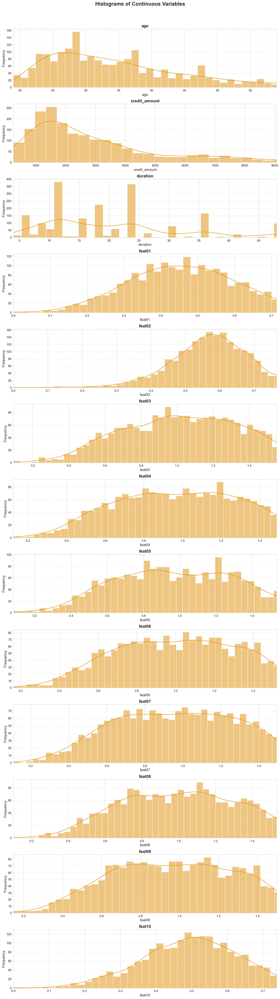

In [13]:
# Plot histograms of continuous variables
def plot_histograms(
    data: pd.DataFrame,
    columns: list,
    bins: int = 100,
    min_quantile: float = 0.0,
    max_quantile: float = 0.99,
) -> None:
    sns.set_palette("colorblind")

    fig, axes = plt.subplots(len(columns), 1)
    fig.set_size_inches(15, 4 * len(columns))

    for ax, col in zip(axes, columns):
        sns.histplot(data[col], bins=bins, kde=True, ax=ax, color=sns.color_palette()[1])

        ax.set_xlabel(col, fontsize=14)
        ax.set_ylabel('Frequency', fontsize=14)

        ax.set_title(col, fontsize=16, fontweight='bold')

        ax.grid(axis='y', linestyle='--', alpha=0.6)

        ax.tick_params(axis='both', which='major', labelsize=12)
        ax.tick_params(axis='both', which='minor', labelsize=10)

        ax.set_xlim(data[col].quantile(q=min_quantile), data[col].quantile(q=max_quantile))

    plt.tight_layout()

    plt.suptitle('Histograms of Continuous Variables', y=1.02, fontsize=20, fontweight='bold')

    plt.show()

plot_histograms(
    data=df, columns=continuous_variables_vis, bins=50, min_quantile=0, max_quantile=.95
)


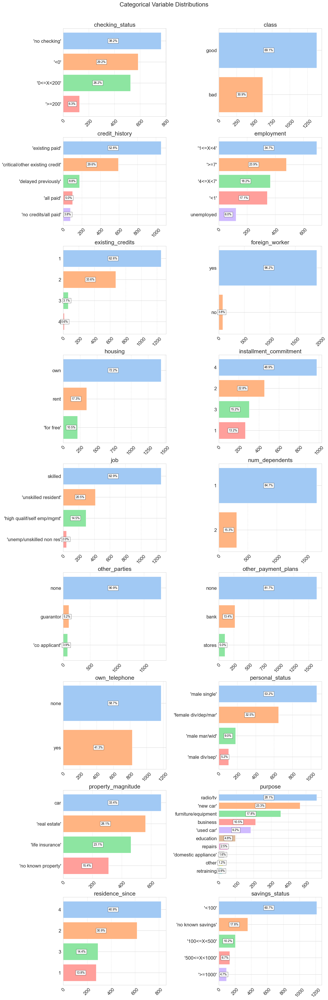

In [14]:
# Plot bar plots of categorical variables
plt.rcParams.update({'font.size': 16})

num_plots = len(categorical_variables_vis)
num_rows = (num_plots + 1) // 2  
fig, axs = plt.subplots(num_rows, 2, sharex=False, sharey=False, constrained_layout=True, figsize=(15, 5 * num_rows))

colors = sns.color_palette("pastel")

for a, cat_col in enumerate(categorical_variables_vis):
    value_counts = df[cat_col].value_counts()
    x_pos = np.arange(0, df[cat_col].nunique())

    trace_x = a // 2
    trace_y = a % 2

    bars = axs[trace_x, trace_y].barh(x_pos, value_counts.values, tick_label=value_counts.index, color=colors)

    axs[trace_x, trace_y].set_title(cat_col)
    axs[trace_x, trace_y].invert_yaxis()  

    for tick in axs[trace_x, trace_y].get_xticklabels():
        tick.set_rotation(45)

    axs[trace_x, trace_y].grid(axis='x', linestyle='--', alpha=0.6)

    total = sum(value_counts.values)
    for bar in bars:
        percentage = f'{bar.get_width() / total * 100:.1f}%'
        bbox_props = dict(boxstyle="square,pad=0.3", fc="white", ec="black", lw=0.5)
        axs[trace_x, trace_y].annotate(percentage,
                                      xy=(bar.get_x() + bar.get_width() / 2, bar.get_y() + bar.get_height() / 2),
                                      xytext=(3, 0),  
                                      textcoords="offset points",
                                      ha='center', va='center', fontsize=10, color='black',
                                      bbox=bbox_props)


plt.suptitle('Categorical Variable Distributions', y=1.02, fontsize=20)

plt.show()


### EDA based on target

C:\Users\adamj\AppData\Local\Temp\ipykernel_16412\2481169115.py:38: UserWarning:

The figure layout has changed to tight



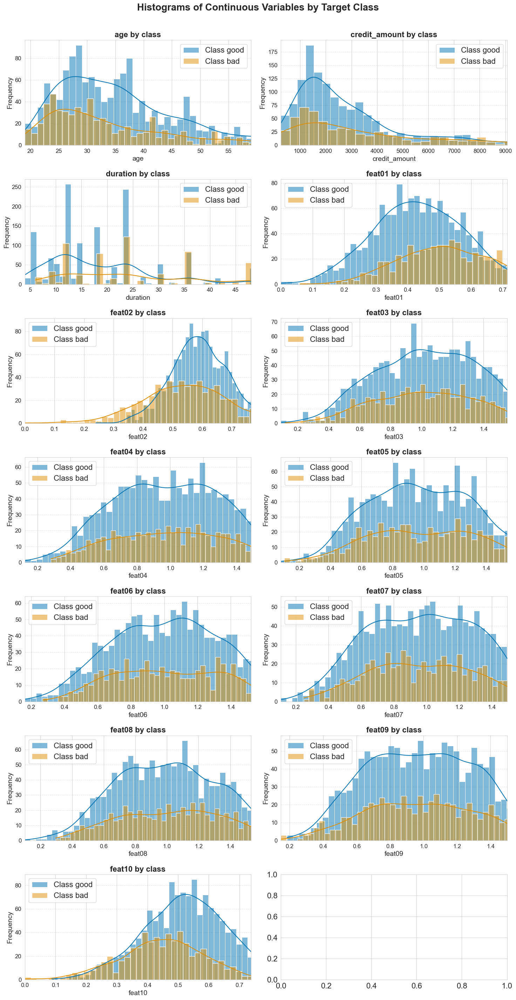

In [15]:
# Plot histograms of continuous variables by target class
def plot_histograms_by_class(
    data: pd.DataFrame,
    columns: list,
    target_variable: str,
    bins: int = 50,
    min_quantile: float = 0.0,
    max_quantile: float = 0.95,
) -> None:
    sns.set_palette("colorblind")
    num_plots = len(columns)
    num_rows = (num_plots + 1) // 2
    fig, axs = plt.subplots(num_rows, 2, sharex=False, sharey=False, constrained_layout=True, figsize=(15, 4 * num_rows))

    for a, col in enumerate(columns):
        unique_classes = data[target_variable].unique()
        
        for i, target_class in enumerate(unique_classes):
            ax = axs[a // 2, a % 2]
            
            data_class = data[data[target_variable] == target_class][col]

            sns.histplot(data_class, bins=bins, kde=True, ax=ax, color=sns.color_palette()[i], label=f'Class {target_class}')

            ax.set_xlabel(col, fontsize=14)
            ax.set_ylabel('Frequency', fontsize=14)

            ax.set_title(f'{col} by {target_variable}', fontsize=16, fontweight='bold')

            ax.grid(axis='y', linestyle='--', alpha=0.6)
            ax.legend()

            ax.tick_params(axis='both', which='major', labelsize=12)
            ax.tick_params(axis='both', which='minor', labelsize=10)

            ax.set_xlim(data[col].quantile(q=min_quantile), data[col].quantile(q=max_quantile))

    plt.tight_layout()

    plt.suptitle('Histograms of Continuous Variables by Target Class', y=1.02, fontsize=20, fontweight='bold')

    plt.show()

plot_histograms_by_class(
    data=df, columns=continuous_variables_vis, target_variable='class', bins=50, min_quantile=0, max_quantile=.95
)


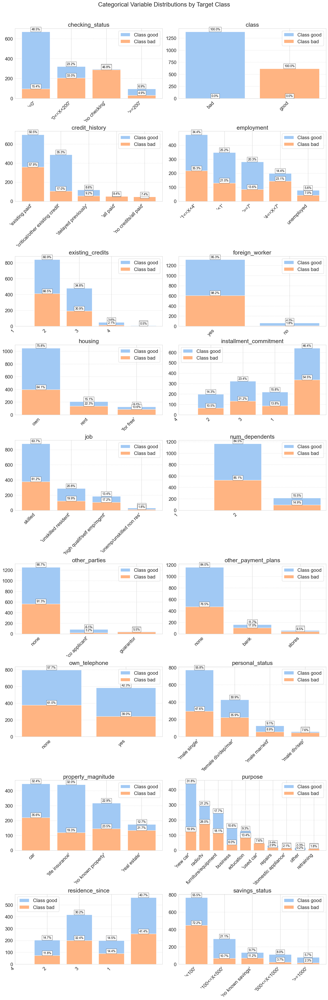

In [16]:
# Plot bar plots of categorical variables by target class
plt.rcParams.update({'font.size': 16})

num_plots = len(categorical_variables_vis)
num_rows = (num_plots + 1) // 2  
fig, axs = plt.subplots(num_rows, 2, sharex=False, sharey=False, constrained_layout=True, figsize=(15, 5 * num_rows))

colors = sns.color_palette("pastel")

for a, cat_col in enumerate(categorical_variables_vis):
    unique_classes = df['class'].unique()
    
    for i, target_class in enumerate(unique_classes):
        value_counts = df[df['class'] == target_class][cat_col].value_counts()

        trace_x = a // 2
        trace_y = a % 2

        bars = axs[trace_x, trace_y].bar(value_counts.index, value_counts.values, color=colors[i], label=f'Class {target_class}')

        axs[trace_x, trace_y].set_title(cat_col)
        axs[trace_x, trace_y].set_xticks(range(len(value_counts.index)))
        axs[trace_x, trace_y].set_xticklabels(value_counts.index, rotation=45, ha='right')
        axs[trace_x, trace_y].grid(axis='y', linestyle='--', alpha=0.6)
        axs[trace_x, trace_y].legend()

        total = sum(value_counts.values)
        for bar in bars:
            percentage = f'{bar.get_height() / total * 100:.1f}%'
            bbox_props = dict(boxstyle="square,pad=0.3", fc="white", ec="black", lw=0.5)
            axs[trace_x, trace_y].annotate(percentage,
                                          xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()),
                                          xytext=(0, 3),
                                          textcoords="offset points",
                                          ha='center', va='bottom', fontsize=10, color='black',
                                          bbox=bbox_props)

plt.suptitle('Categorical Variable Distributions by Target Class', y=1.02, fontsize=20)

plt.show()


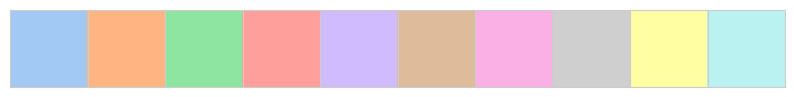

In [17]:
# Set palette for seaborn
sns.set_palette(palette="pastel")
sns.palplot(sns.color_palette())

Next, we can proceed with the exploratory data analysis (EDA) and delve into the distributional characteristics of the features, as well as examining any correlations or associations between variables and the target using Spearman correlation and Chi-square tests.

**Spearman correlation Results:**

After performing Spearman correlation analysis between the features and the target variable, the following findings were observed:

Significant Columns:

- feat10: Spearman correlation coefficient: -0.244
- feat02: Spearman correlation coefficient: -0.176
- age: Spearman correlation coefficient: -0.113
- credit_amount: Spearman correlation coefficient: 0.094
- duration: Spearman correlation coefficient: 0.214
- feat01: Spearman correlation coefficient: 0.248

These columns exhibit relatively strong correlations (either positive or negative) with the target variable, indicating their potential significance in predicting credit risk.

Not Significant Columns:

- feat03: Spearman correlation coefficient: -0.029
- feat09: Spearman correlation coefficient: -0.010
- feat07: Spearman correlation coefficient: 0.006
- feat04: Spearman correlation coefficient: 0.010
- feat05: Spearman correlation coefficient: 0.012
- feat06: Spearman correlation coefficient: 0.020
- feat08: Spearman correlation coefficient: 0.028

These columns demonstrate weak correlations with the target variable and are considered not significant for predicting credit risk based on Spearman correlation analysis.

**Chi-squared Test Results:**

The chi-squared test was applied to assess the association between categorical variables and the target variable ('class'). Significant associations were found for variables such as checking status, credit history, personal status, purpose, and savings status, suggesting that these factors may influence the target variable.

Conversely, no significant associations were observed for employment status, foreign worker status, housing, job type, other parties, other payment plans, own telephone ownership, property magnitude, and the number of dependents with the target variable.

| Variable            | Chi-squared | P-value |
|---------------------|-------------|---------|
| checking_status     | 166.35      | 0.00    |
| credit_history      | 13.34       | 0.00    |
| employment          | 0.36        | 0.55    |
| foreign_worker      | 0.38        | 0.54    |
| housing             | 0.31        | 0.57    |
| job                 | 1.74        | 0.19    |
| other_parties       | 0.07        | 0.79    |
| other_payment_plans | 0.44        | 0.51    |
| own_telephone       | 1.15        | 0.28    |
| personal_status     | 10.96       | 0.00    |
| property_magnitude  | 1.18        | 0.28    |
| purpose             | 32.29       | 0.00    |
| savings_status      | 10.43       | 0.00    |
| num_dependents      | 0.10        | 0.75    |

These results provide valuable insights into the relationship between categorical variables and the target variable, informing feature selection and model building processes.

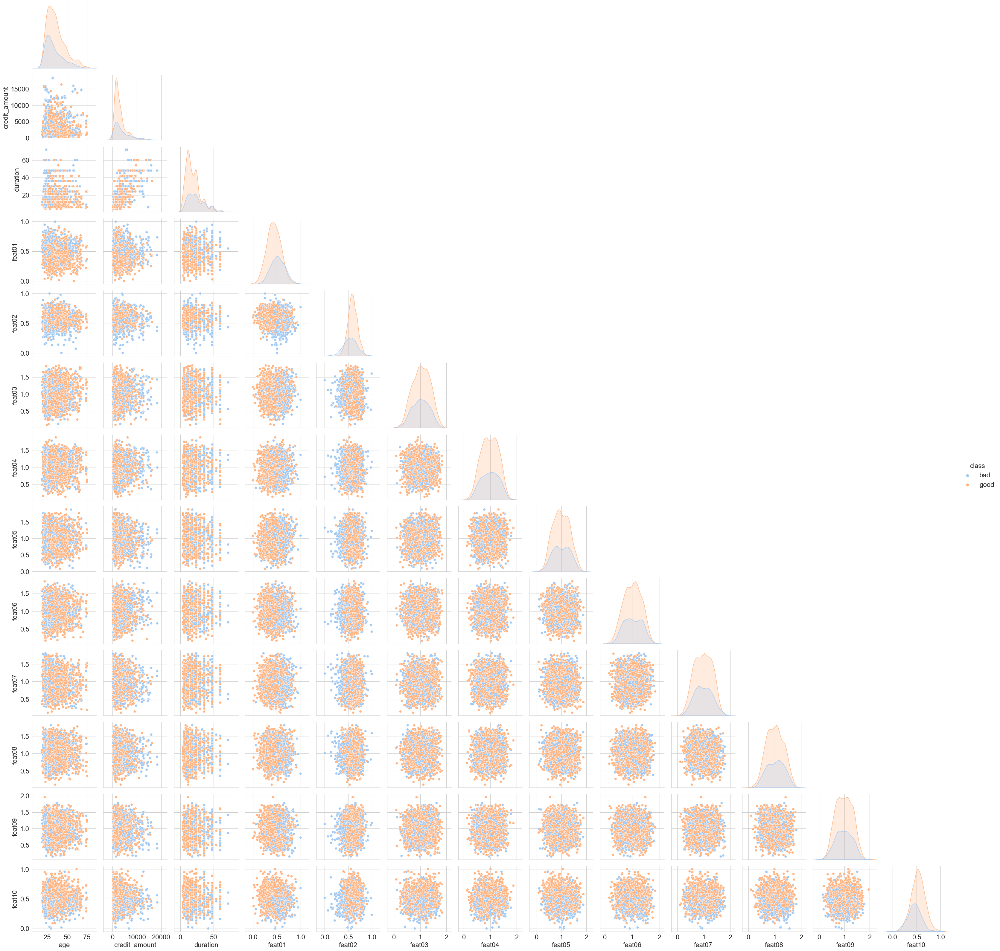

In [18]:
# Plot the pairplot
sns.pairplot(df, hue='class', corner=True)

In [19]:
# Plot the correlation matrix
df_corr = df[continuous_variables_vis]

corr = df_corr.corr()
pio.templates.default = "plotly_white"

trace = go.Heatmap(z=corr.values,
                  x=corr.index.values,
                  y=corr.columns.values,
                  colorscale=px.colors.sequential.RdBu,
                  zmin=-1,
                  zmax=1)

layout = go.Layout(
    title='Pearson Correlation of features',
    xaxis = dict(ticks='', nticks=52),
    yaxis = dict(ticks='' ),
    width = 800, height = 600,
margin=dict(
    l=240,
),)

fig = go.Figure(layout=layout)
fig.add_trace(trace)
fig.show()

In [20]:
def calculate_correlation(data: pd.DataFrame, target_col: str) -> dict:
    numeric_df = data.select_dtypes(include=np.number).dropna()
    correlation_results = {}
    
    for col in [col for col in numeric_df.columns if col != target_col]:
        correlation, p_value = stats.spearmanr(
            numeric_df[col], numeric_df[target_col]
        )
        correlation_results[col] = {"correlation": correlation, "p_value": p_value}
    
    return correlation_results

def sort_dict(dictionary: dict) -> dict:
    return dict(sorted(dictionary.items(), key=lambda item: item[1], reverse=False))

def plot_correlation_bars(significant_cols, not_significant_cols, target_col):
    fig, ax = plt.subplots(1, 1)
    fig.set_size_inches(8, 0.5 * len(significant_cols) + len(not_significant_cols))

    ax.barh(
        list(not_significant_cols.keys()),
        list(not_significant_cols.values()),
        label="Not statistically significant correlation",
    )
    ax.barh(
        list(significant_cols.keys()),
        list(significant_cols.values()),
        label="Statistically significant correlation",
    )

    ax.set_title(f"Spearman correlation with {target_col} variable")
    ax.set_xlabel("Correlation coefficient", size=10)
    ax.set_ylabel("Column", size=10)
    ax.margins(0.01)
    ax.tick_params(axis="both", labelsize=10)
    plt.legend(loc='lower right', fontsize='x-small')

def get_correlation_data_and_plot(
    df: pd.DataFrame,
    significance_level: float = 0.05,
    target_col: str = "target",
) -> tuple:
    correlation_data = calculate_correlation(df, target_col)

    significant_cols = {
        col: result["correlation"]
        for col, result in correlation_data.items()
        if result["p_value"] <= significance_level
    }
    not_significant_cols = {
        col: result["correlation"]
        for col, result in correlation_data.items()
        if result["p_value"] > significance_level
    }

    sorted_significant_cols = sort_dict(significant_cols)
    sorted_not_significant_cols = sort_dict(not_significant_cols)

    plot_correlation_bars(sorted_significant_cols, sorted_not_significant_cols, target_col)

    return sorted_significant_cols, sorted_not_significant_cols

Significant Columns:
{'feat10': -0.24377709742873788, 'feat02': -0.17614526298590713, 'age': -0.11332942284840665, 'credit_amount': 0.09383484655502605, 'duration': 0.21437558485339486, 'feat01': 0.24837822123179584}

Not Significant Columns:
{'feat03': -0.029018004009265307, 'feat09': -0.009923808772786915, 'feat07': 0.005944914339429669, 'feat04': 0.009946298990968869, 'feat05': 0.011541230297039061, 'feat06': 0.01995444608193811, 'feat08': 0.027852261033500726}


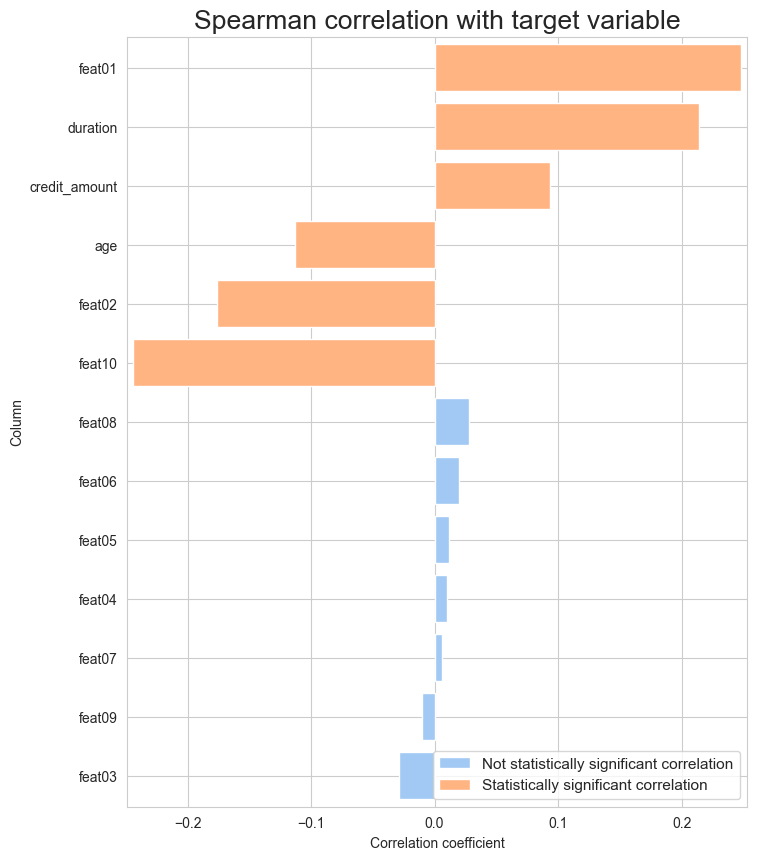

In [21]:
# Spearman correlation
target_column = "target"
significance_level = 0.05

df_2 = df.copy()
df_2['target'] = df_2['class'].map({'good': 0, 'bad': 1}).astype('int')
df_2 = df_2.drop('class', axis=1)

significant_cols, not_significant_cols = get_correlation_data_and_plot(df_2, significance_level, target_column)

print("Significant Columns:")
print(significant_cols)

print("\nNot Significant Columns:")
print(not_significant_cols)

In [22]:
# Chi2 test
df2 = df.copy()
df2['target'] = df2['class'].map({'good': 0, 'bad': 1}).astype('int')
df2 = df2.drop('class', axis=1)

str_columns = ['checking_status', 'credit_history', 'employment', 'foreign_worker', 'housing',
                'job', 'other_parties', 'other_payment_plans', 'own_telephone', 'personal_status',
                'property_magnitude', 'purpose', 'savings_status', 'num_dependents']

df2[str_columns] = df2[str_columns].astype(str)

def label_encoder(dataframe, columns):
    labelencoder = LabelEncoder()
    dataframe[columns] = dataframe[columns].apply(labelencoder.fit_transform)
    return dataframe

df2 = label_encoder(df2, str_columns)

chi, p_val = chi2(df2[str_columns], df2['target'])

s = pd.DataFrame({"Chi2": np.around(chi, 2), "P_val": np.around(p_val, 2)}, index=str_columns)

s

,Chi2,P_val
checking_status,166.35,0.00
credit_history,13.34,0.00
employment,0.36,0.55
foreign_worker,0.38,0.54
housing,0.31,0.57
job,1.74,0.19
other_parties,0.07,0.79
other_payment_plans,0.44,0.51
own_telephone,1.15,0.28
personal_status,10.96,0.00


## Data Transformation

**Data Processing:**

In this phase, various data transformation techniques were applied to preprocess the dataset before modeling. The following steps were undertaken:

**One Hot Encoding Categorical Variables:**
Categorical variables were encoded using One Hot Encoding to transform them into numerical values, making them suitable for machine learning algorithms.

**Scaling Variables:**
Variables were scaled using both StandardScaler and MinMaxScaler to ensure that all features have the same scale. StandardScaler was applied to standardize the features by removing the mean and scaling to unit variance, while MinMaxScaler was used to scale features to a range between 0 and 1 and to deal with potential outliers.

**Train-Test Split:**
The dataset was split into training and testing sets using train_test_split, where the test set comprised 20% of the data. This ensured the availability of out-of-sample data for evaluating model performance.

**Scaler Application:**
Scalers were fitted on the training split to learn the parameters necessary for scaling. Subsequently, both the training and testing sets were transformed using these scalers to maintain consistency in scaling across all datasets.

These data processing steps were essential in preparing the dataset for machine learning modeling, ensuring that the features are appropriately transformed and scaled while maintaining the integrity of the data.

In [23]:
# Map the categorical columns for CatBoost
checking_account_mapping = {
    "'no checking'": 'no checking',
    "'<0'": '(-inf;0)',
    "'0<=X<200'": '{0;200)',
    "'>=200'": '{200;inf)',
}

df['checking_status'] = df['checking_status'].map(checking_account_mapping)

savings_status_mapping = {
    "'<100'": '(-inf;100)',
    "'no known savings'": 'no known savings',
    "'100<=X<500'": '{100;500)',
    "'500<=X<1000'": '{500;1000)',
    "'>=1000'": '{1000;inf)'
}

df['savings_status'] = df['savings_status'].map(savings_status_mapping)

employment_mapping = {
    'unemployed': 'unemployed',
    "'<1'": '(-inf;1)',
    "'1<=X<4'": '{1;4)',
    "'4<=X<7'": '{4;7)',
    "'>=7'": '{7;inf)'
}

df['employment'] = df['employment'].map(employment_mapping)

df.head()

,age,checking_status,class,credit_amount,credit_history,duration,employment,existing_credits,feat01,feat02,...,job,num_dependents,other_parties,other_payment_plans,own_telephone,personal_status,property_magnitude,purpose,residence_since,savings_status
0,50,no checking,good,2319,'existing paid',21,{7;inf),2,0.239898,0.614230,...,skilled,1,none,none,none,'male single','real estate',furniture/equipment,2,(-inf;100)
1,30,no checking,good,1163,'delayed previously',15,{4;7),2,0.521139,0.790472,...,skilled,1,none,none,none,'female div/dep/mar','life insurance',furniture/equipment,2,{1000;inf)
2,32,no checking,good,1502,'critical/other existing credit',10,{7;inf),2,0.286838,0.541756,...,'unskilled resident',2,none,none,none,'male single','real estate','new car',4,(-inf;100)
3,34,no checking,good,4436,'delayed previously',36,{1;4),2,0.430937,0.531140,...,skilled,1,none,none,none,'female div/dep/mar','real estate',radio/tv,4,(-inf;100)
4,21,no checking,good,10155,'existing paid',60,{4;7),1,0.439643,0.602667,...,skilled,1,none,none,yes,'female div/dep/mar','real estate',radio/tv,4,{100;500)


In [24]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.difference(['class'])

In [25]:
# Map target variable to 0 and 1 for binary classification
# Perform one-hot encoding on the categorical columns
df_clean = pd.get_dummies(df, columns = categorical_cols)
df_clean['class'] = df_clean['class'].map({'good': 0, 'bad': 1})
df_clean['class'] = df_clean['class'].astype('int')

In [26]:
df_clean.head()

,age,class,credit_amount,duration,feat01,feat02,feat03,feat04,feat05,feat06,...,purpose_retraining,residence_since_1,residence_since_2,residence_since_3,residence_since_4,savings_status_{100;500),savings_status_{500;1000),savings_status_(-inf;100),savings_status_{1000;inf),savings_status_no known savings
0,50,0,2319,21,0.239898,0.614230,1.309659,0.976446,0.709972,0.569710,...,0,0,1,0,0,0,0,1,0,0
1,30,0,1163,15,0.521139,0.790472,1.452737,1.200229,1.202883,0.957488,...,0,0,1,0,0,0,0,0,1,0
2,32,0,1502,10,0.286838,0.541756,0.957340,0.855904,0.544296,1.140319,...,0,0,0,0,1,0,0,1,0,0
3,34,0,4436,36,0.430937,0.531140,0.941830,1.163647,1.170490,1.339195,...,0,0,0,0,1,0,0,1,0,0
4,21,0,10155,60,0.439643,0.602667,1.108556,0.763794,1.025325,0.633543,...,0,0,0,0,1,1,0,0,0,0


In [27]:
df_clean.to_csv('../data/data_clean.csv', index=False)

In [28]:
# Split the data into train and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    df_clean.drop('class', axis=1), df_clean['class'], test_size=0.2, random_state=24)

In [29]:
# Save the data
data_path = Path.cwd().parent / "data"
X_train.to_csv(data_path / "X_train_not_scaled.csv", index=False)
y_train.to_csv(data_path / "y_train_not_scaled.csv", index=False)
X_test.to_csv(data_path / "X_test_not_scaled.csv", index=False)
y_test.to_csv(data_path / "y_test_not_scaled.csv", index=False)

In [30]:
# Scale the data
from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler = MinMaxScaler()
columns_to_scale = ['age', 'credit_amount', 'duration']
X_train[columns_to_scale] = scaler.fit_transform(X_train[columns_to_scale])

std = StandardScaler()
num_cols = ["feat01", "feat02", "feat03", "feat04", "feat05", "feat06", "feat07", "feat08", "feat09", "feat10"]
X_train[num_cols] = std.fit_transform(X_train[num_cols])

X_test[columns_to_scale] = scaler.transform(X_test[columns_to_scale])
X_test[num_cols] = std.transform(X_test[num_cols])

X_test.head()

,age,credit_amount,duration,feat01,feat02,feat03,feat04,feat05,feat06,feat07,...,purpose_retraining,residence_since_1,residence_since_2,residence_since_3,residence_since_4,savings_status_{100;500),savings_status_{500;1000),savings_status_(-inf;100),savings_status_{1000;inf),savings_status_no known savings
1084,0.410714,0.193701,0.117647,0.200055,-0.710234,1.116151,0.424462,-0.729317,-0.239899,0.470844,...,0,0,0,0,1,0,0,1,0,0
1410,0.178571,0.628180,0.602941,0.583837,0.420252,0.671794,0.873512,-0.022339,-0.109719,0.681030,...,0,0,0,0,1,0,0,1,0,0
1930,0.357143,0.106982,0.382353,0.014240,0.616924,-2.031472,-0.865059,0.204781,-0.049097,-0.709447,...,0,0,0,1,0,0,0,1,0,0
1270,0.053571,0.133355,0.294118,-0.500509,-0.803668,1.371379,-0.068915,1.368517,-1.418073,0.626336,...,0,0,0,0,1,0,1,0,0,0
1280,0.250000,0.065081,0.117647,-1.377393,1.373741,-1.044958,0.012647,-1.298857,-0.823372,-1.332944,...,0,1,0,0,0,0,0,1,0,0


In [31]:
# Save scaled data
data_path = Path.cwd().parent / "data"
X_train.to_csv(data_path / "X_train.csv", index=False)
y_train.to_csv(data_path / "y_train.csv", index=False)
X_test.to_csv(data_path / "X_test.csv", index=False)
y_test.to_csv(data_path / "y_test.csv", index=False)

## Modelling

**Modelling Approach:**

In our pursuit of developing a reliable and accurate predictive model for credit risk classification, we embarked on a systematic approach to explore various machine learning algorithms. Leveraging AutoML capabilities, we evaluated a range of algorithms and selected the most promising ones based on their performance metrics and suitability for the task at hand.

**Random Forest Classifier:**
A foundational model in predictive modeling, the Random Forest Classifier adopts a bagging (Bootstrap Aggregating) ensemble technique. It constructs multiple decision trees, training each on a subset of the dataset through bootstrapping, and subsequently aggregates their predictions. This methodology enhances robustness and interpretability, serving as an invaluable tool for establishing baseline predictive performance.

**XGBoost Classifier:**
XGBoost, short for eXtreme Gradient Boosting, is a powerful and efficient gradient boosting algorithm designed for classification and regression tasks. It sequentially builds a series of decision trees, each correcting errors from the previous ones. XGBoost introduces regularization techniques and utilizes gradient information for optimal tree construction, making it highly robust and adaptable to different data distributions. Known for its state-of-the-art performance and minimal hyperparameter tuning requirements, XGBoost is a popular choice in machine learning competitions and real-world applications where accuracy and efficiency are paramount.

**CatBoost Classifier:**
CatBoost, short for Categorical Boosting, is a high-performance gradient boosting framework tailored for classification tasks. Designed to handle categorical features seamlessly, CatBoost employs advanced strategies to accelerate model training without compromising accuracy. With its efficient handling of large datasets and built-in support for categorical variables, CatBoost stands out for its speed and effectiveness. The framework incorporates techniques to reduce memory usage and accelerate convergence, making it particularly well-suited for complex classification challenges.

**Stacking:**
As an advanced ensemble technique, stacking combines predictions from diverse models through a meta-model. By strategically incorporating the outputs of multiple base models, stacking enhances predictive performance beyond the capabilities of individual models. This approach mitigates biases and anomalies, contributing to improved accuracy and reliability in classification scenarios.

**Voting:**
The voting ensemble method aggregates predictions from multiple models through a majority decision. This approach is pivotal in alleviating individual model biases and anomalies, fostering a more robust and accurate final prediction in classification tasks.

**Extra Trees Classifier:**
An ensemble learning method that belongs to the family of decision tree-based models. Similar to Random Forests, Extra Trees builds multiple decision trees during training but with a key distinction — it introduces an additional layer of randomness in the tree-building process. Rather than selecting the optimal split at each node, Extra Trees randomly chooses splits, leading to a higher level of diversity among the individual trees. This technique often results in improved generalization performance and robustness.

This comprehensive approach allowed us to explore a diverse range of algorithms and ensemble techniques, leveraging their strengths to develop a robust and accurate predictive model for credit risk classification.

### Modelling Steps

1. Feature Selection
- **Forward Selection Algorithm**: Utilized the Forward Selection algorithm with Random Forest to select the final set of features.
- **Objective**: The primary objective of feature selection was to identify the most relevant variables for each model, enhancing predictive power and reducing dimensionality.

2. Hyperparameter Tuning
- **Random Search**: Employed Random Search to find the optimal hyperparameters for each model.
- **Optimization Goals**: Fine-tuned hyperparameters such as learning rate, subsample, n_estimators, max_depth, colsample_bytree, and colsample_bylevel to improve model performance and generalization.

3. Cross-Validation
- **Stratified K-Fold Cross-Validation**: Implemented Stratified K-Fold Cross-Validation to evaluate model performance.
- **Data Splitting**: Ensured that the distribution of the target variable was maintained during data splitting to prevent bias in evaluation.
- **Evaluation Benefits**: Cross-validation helped estimate the model's performance on unseen data, providing insights into its generalization capability.

4. Model Evaluation Metrics
- **Performance Metrics**: Evaluated models using various metrics to assess effectiveness.
- **Metrics Considered**:
  - Area Under the Precision-Recall Curve (AUC PR)
  - Balanced Accuracy
  - Gini Coefficient
  - Lift Curve
  - Cumulative Gain Curve
  - Area Under the ROC Curve (AUC)
- **Insights**: These metrics provided comprehensive insights into the model's performance, including its ability to rank positive samples, balance between sensitivity and specificity, and overall discriminative power.

# Results Analysis

## Model Performance and Hyperparameters

### Random Forest
- **Hyperparameters**:
  - `n_estimators`: 100
  - `max_depth`: 8
  - `min_samples_split`: 7
  - `min_samples_leaf`: 4
  - `max_features`: 'sqrt'
- **Results**:
  - AUC PR: 0.76
  - Balanced Accuracy: 0.71
  - Gini: 0.73

### XGBoost
- **Hyperparameters**:
  - `n_estimators`: 300
  - `max_depth`: 9
  - `learning_rate`: 0.07
  - `subsample`: 0.7
  - `colsample_bytree`: 0.4
  - `colsample_bylevel`: 0.4
- **Results**:
  - AUC PR: 0.85
  - Balanced Accuracy: 0.83
  - Gini: 0.83

### CatBoost
- **Hyperparameters**:
  - `iterations`: 450
  - `depth`: 6
  - `learning_rate`: 0.09
  - `subsample`: 0.7
  - `colsample_bylevel`: 0.8
- **Results**:
  - AUC PR: 0.83
  - Balanced Accuracy: 0.79
  - Gini: 0.79

### Extra Trees
- **Hyperparameters**:
  - `n_estimators`: 200
  - `max_depth`: 8
  - `min_samples_split`: 8
  - `min_samples_leaf`: 2
- **Results**:
  - AUC PR: 0.85
  - Balanced Accuracy: 0.76
  - Gini: 0.85

### Stacking
- **Hyperparameters**:
  - `penalty`: 'l2'
  - `C`: 10
- **Results**:
  - AUC PR: 0.91
  - Balanced Accuracy: 0.87
  - Gini: 0.9

### Voting
- **Hyperparameters**:
  - `weights`: None
  - `voting`: 'soft'
  - `flatten_transform`: False
- **Results**:
  - AUC PR: 0.8
  - Balanced Accuracy: 0.76
  - Gini: 0.76

## Model Comparison and Selection
- Based on the evaluation metrics, the Stacking model outperforms others in terms of AUC PR, Balanced Accuracy, and Gini coefficient.
- However, considering different evaluation categories, XGBoost and Extra Trees models demonstrate the best performance in terms of overall predictive capability and robustness.

## Summary of Modeling Phase
- The modeling process involved extensive experimentation and evaluation, including feature selection, hyperparameter tuning, and model evaluation using various metrics.
- Each model was carefully tuned using Random Search for hyperparameter optimization.
- The chosen models were then evaluated based on performance metrics such as AUC PR, Balanced Accuracy, and Gini coefficient.
- The Stacking model emerged as the top performer in terms of overall performance, but Extra Trees and XGBoost models showed superior predictive capability across different evaluation categories.

In [32]:
# AutoML approach: Apply LazyPredict to get a quick overview of the performance of different models
from lazypredict.Supervised import LazyClassifier

clf = LazyClassifier(predictions = True)
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
models

c:\Users\adamj\AppData\Local\Programs\Python\Python311\Lib\site-packages\dask\dataframe\utils.py:367: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

c:\Users\adamj\AppData\Local\Programs\Python\Python311\Lib\site-packages\dask\dataframe\utils.py:367: FutureWarning:

pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

c:\Users\adamj\AppData\Local\Programs\Python\Python311\Lib\site-packages\dask\dataframe\utils.py:367: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

100%|██████████| 29/29 [00:02<00:00, 13.84it/s]

[LightGBM] [Info] Number of positive: 485, number of negative: 1115
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3082
[LightGBM] [Info] Number of data points in the train set: 1600, number of used features: 78
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.303125 -> initscore=-0.832461
[LightGBM] [Info] Start training from score -0.832461


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
ExtraTreesClassifier,0.94,0.92,0.92,0.94,0.18
LabelPropagation,0.92,0.88,0.88,0.92,0.14
LabelSpreading,0.92,0.88,0.88,0.92,0.15
SVC,0.88,0.85,0.85,0.88,0.07
NuSVC,0.87,0.83,0.83,0.87,0.08
LGBMClassifier,0.86,0.83,0.83,0.86,0.09
NearestCentroid,0.80,0.81,0.81,0.81,0.01
ExtraTreeClassifier,0.84,0.81,0.81,0.84,0.01
XGBClassifier,0.83,0.80,0.80,0.83,0.12


In [33]:
# Train the basic models
classifiers = [("LogisticRegression",LogisticRegression()),
       ("KNN Classifier", KNeighborsClassifier()),
       ("RandomForest",RandomForestClassifier()),
       ("CatBoost",CatBoostClassifier()),
       ("XGBoost",XGBClassifier())]
for name, model in classifiers:
    if name == "CatBoost":
        model.fit(X_train, y_train, verbose_eval=False)
    else:
        model.fit(X_train, y_train)
    y2 = model.predict(X_test)
    acc_te = accuracy_score(y_test, y2)
    auc = roc_auc_score(y_test, y2)
    print(f"For {name}::\nTesting Accuracy is: {acc_te}\nTesting AUC is: {acc_te}")
    print("--"*40)

For LogisticRegression::
Testing Accuracy is: 0.805
Testing AUC is: 0.805
--------------------------------------------------------------------------------
For KNN Classifier::
Testing Accuracy is: 0.76
Testing AUC is: 0.76
--------------------------------------------------------------------------------
For RandomForest::
Testing Accuracy is: 0.8475
Testing AUC is: 0.8475
--------------------------------------------------------------------------------
For CatBoost::
Testing Accuracy is: 0.86
Testing AUC is: 0.86
--------------------------------------------------------------------------------
For XGBoost::
Testing Accuracy is: 0.835
Testing AUC is: 0.835
--------------------------------------------------------------------------------


## Random Forest

In [36]:
data_path = Path.cwd().parent / "data"
X_train = pd.read_csv(data_path / "X_train.csv")
y_train = pd.read_csv(data_path / "y_train.csv")
X_test = pd.read_csv(data_path / "X_test.csv")
y_test = pd.read_csv(data_path / "y_test.csv")

In [37]:
rf_classifier = RandomForestClassifier(random_state=42, verbose=0)
rf_classifier.fit(X_train, y_train)

sfm = SelectFromModel(rf_classifier)
sfm.fit(X_train, y_train)

X_train_selected_df = pd.DataFrame(sfm.transform(X_train), columns=X_train.columns[sfm.get_support(indices=True)])
X_test_selected_df = pd.DataFrame(sfm.transform(X_test), columns=X_train.columns[sfm.get_support(indices=True)])

# Hyperparameter tuning using RandomizedSearchCV
param_dist = {
    'n_estimators': np.arange(50, 500, 50),
    'max_depth': np.arange(2, 10),
    'min_samples_split': np.arange(2, 10),
    'min_samples_leaf': np.arange(1, 5),
    'max_features': ['auto', 'sqrt', 'log2'],
}

n_iter_search = 10

# Use the selected features for RandomizedSearchCV
random_search = RandomizedSearchCV(
    rf_classifier, param_distributions=param_dist, n_iter=n_iter_search,
    cv=StratifiedKFold(n_splits=10), scoring='balanced_accuracy', random_state=42
)
random_search.fit(X_train_selected_df, y_train)

best_params_rf = random_search.best_params_

rf_model = RandomForestClassifier(
    random_state=42,
    **best_params_rf
)
rf_model.fit(X_train_selected_df, y_train)

RandomForestClassifier(max_depth=8, min_samples_leaf=4, min_samples_split=7,
                       random_state=42)

In [38]:
best_params_rf

{'n_estimators': 100,
 'min_samples_split': 7,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 8}

In [39]:
X_train_final_rf = X_train_selected_df.copy()
X_test_final_rf = X_test_selected_df.copy()

In [40]:
# Evaluate the model
y_pr_train_proba = rf_model.predict_proba(X_train_final_rf)[:, 1]  
y_pr_train_binary = rf_model.predict(X_train_final_rf)

acc_train = accuracy_score(y_train, y_pr_train_binary)
acc_balanced_train = balanced_accuracy_score(y_train, y_pr_train_binary)
class_re = classification_report(y_train, y_pr_train_binary)
con_mat = confusion_matrix(y_train, y_pr_train_binary)
auc_train = roc_auc_score(y_train, y_pr_train_proba)

print("Confusion Matrix:\n", con_mat)
print("\n")
print("Accuracy of the model:", acc_train * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_train * 100)
print("\n")
print("Classification report:\n", class_re)
print("AUC of the model:", auc_train)

Confusion Matrix:
 [[1101   14]
 [ 163  322]]


Accuracy of the model: 88.9375


Balanced accuracy of the model: 82.56807359807684


Classification report:
               precision    recall  f1-score   support

           0       0.87      0.99      0.93      1115
           1       0.96      0.66      0.78       485

    accuracy                           0.89      1600
   macro avg       0.91      0.83      0.86      1600
weighted avg       0.90      0.89      0.88      1600

AUC of the model: 0.972718783227775


In [41]:
# Test the model
y_pr_test_proba = rf_model.predict_proba(X_test_final_rf)[:, 1]
y_pr_test_binary = rf_model.predict(X_test_final_rf)

acc_test = accuracy_score(y_test, y_pr_test_binary)
acc_balanced_test = balanced_accuracy_score(y_test, y_pr_test_binary)
class_re1 = classification_report(y_test, y_pr_test_binary)
con_mat1 = confusion_matrix(y_test, y_pr_test_binary)
auc_test = roc_auc_score(y_test, y_pr_test_proba)

print("Confusion Matrix:\n", con_mat1)
print("\n")
print("Accuracy of the model:", acc_test * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_test * 100)
print("\n")
print("Classification report:\n", class_re1)
print("AUC of the model:", auc_test)

Confusion Matrix:
 [[246  21]
 [ 66  67]]


Accuracy of the model: 78.25


Balanced accuracy of the model: 71.25538565514911


Classification report:
               precision    recall  f1-score   support

           0       0.79      0.92      0.85       267
           1       0.76      0.50      0.61       133

    accuracy                           0.78       400
   macro avg       0.77      0.71      0.73       400
weighted avg       0.78      0.78      0.77       400

AUC of the model: 0.8632254794289093


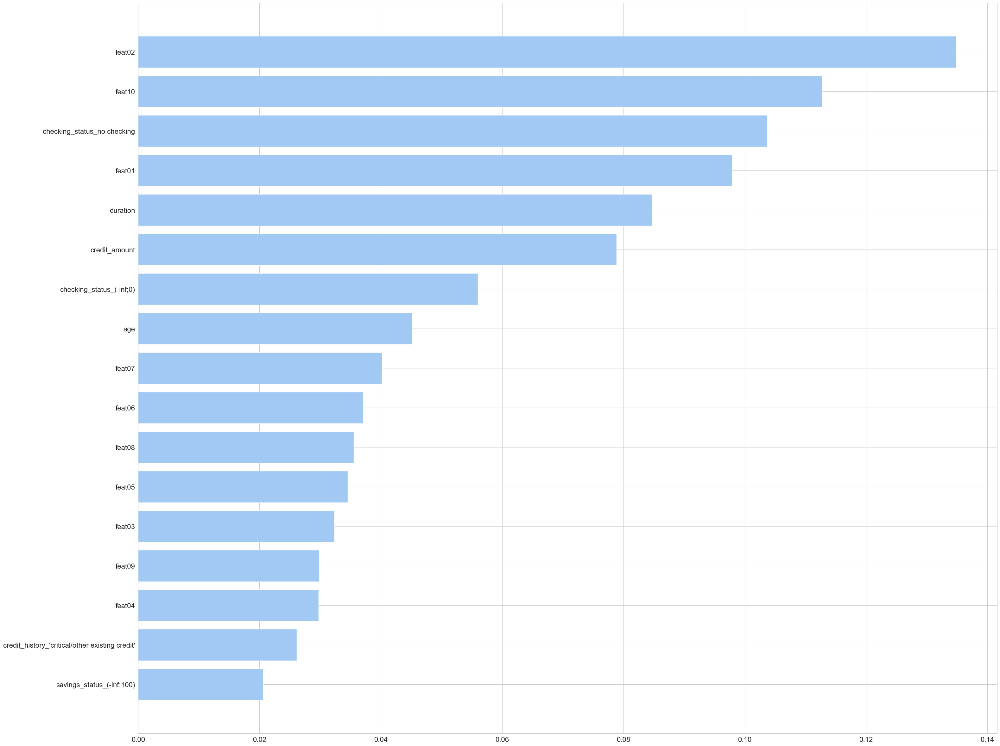

In [42]:
# Feature importance
sorted_idx = rf_model.feature_importances_.argsort()
plt.figure(figsize=(35, 30))
plt.barh(X_train_final_rf.columns[sorted_idx], rf_model.feature_importances_[sorted_idx])
plt.show()

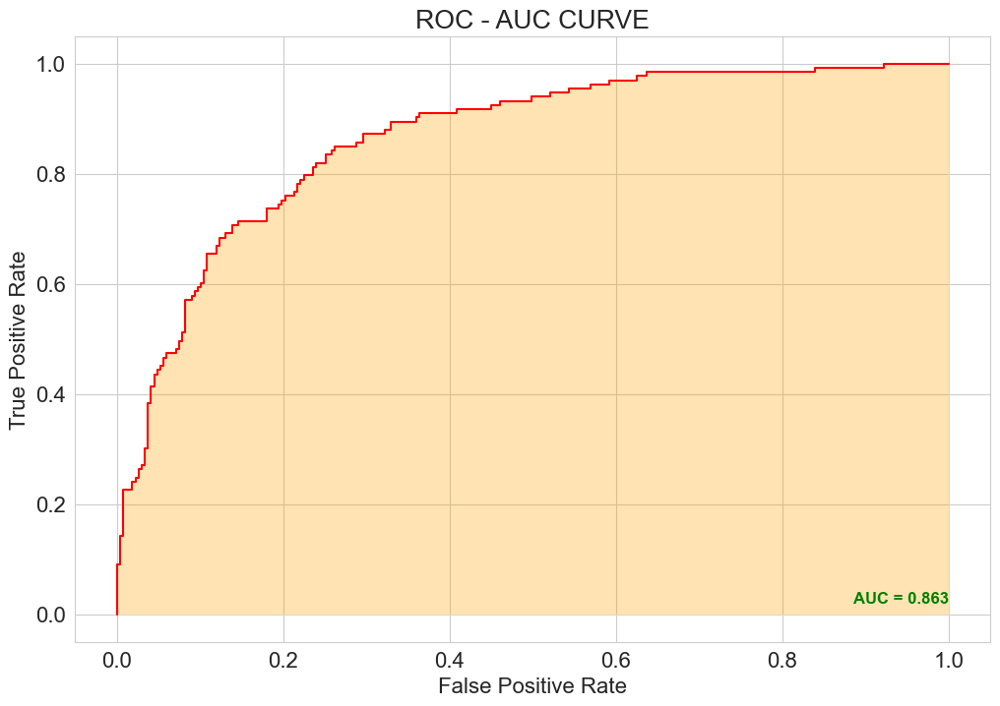

In [43]:
# Ploting the Roc - Auc Curve on Testing data
y_prob = rf_model.predict_proba(X_test_final_rf)
y_pr   = y_prob[:,1]
auc_score = roc_auc_score(y_test, y_pr)
fpr,tpr,threshold = roc_curve(y_test,y_pr)
plt.figure(figsize=(12, 8))
plt.plot(fpr,tpr, "r")
plt.text(1, 0.02, 'AUC = %0.3f' % auc_score, ha='right', fontsize=12,weight='bold', color='green')
plt.fill_between(fpr, tpr, facecolor='orange', alpha=0.3)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC - AUC CURVE")
plt.show()

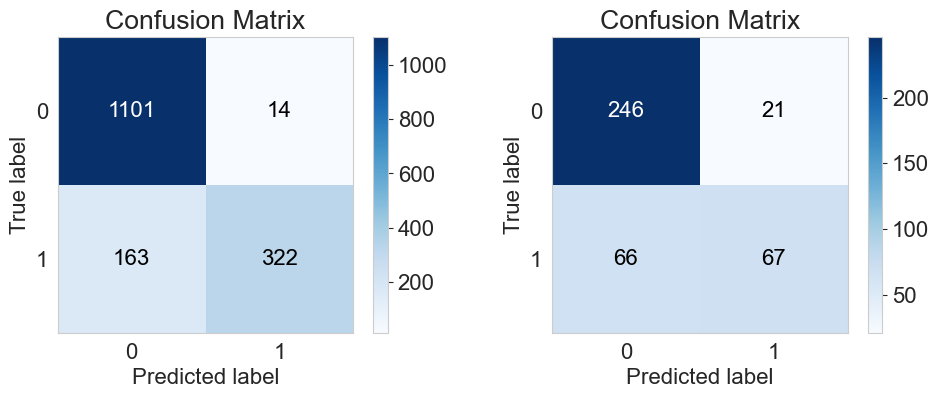

In [44]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axes[0].set_title('Confusion Matrix - Train')
skplt.metrics.plot_confusion_matrix(y_train, y_pr_train_binary, ax=axes[0])
axes[1].set_title('Confusion Matrix - Test')
skplt.metrics.plot_confusion_matrix(y_test, y_pr_test_binary, ax=axes[1])

plt.tight_layout()
plt.show()

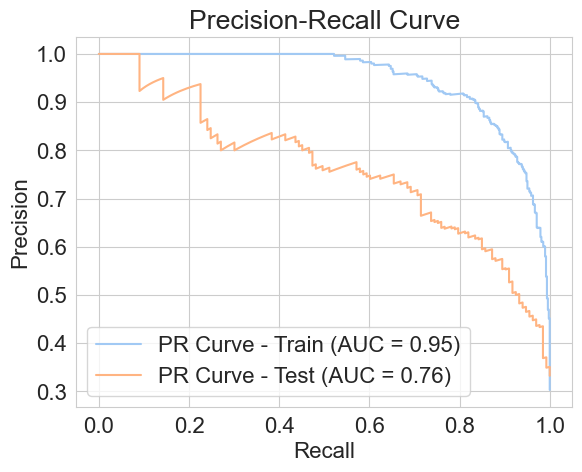

In [45]:
# Precision-Recall Curve
pr_auc_train = average_precision_score(y_train, y_pr_train_proba)
pr_auc_test = average_precision_score(y_test, y_pr_test_proba)

precision_train, recall_train, _ = precision_recall_curve(y_train, y_pr_train_proba)
precision_test, recall_test, _ = precision_recall_curve(y_test, y_pr_test_proba)

plt.plot(recall_train, precision_train, label=f'PR Curve - Train (AUC = {pr_auc_train:.2f})')
plt.plot(recall_test, precision_test, label=f'PR Curve - Test (AUC = {pr_auc_test:.2f})')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()


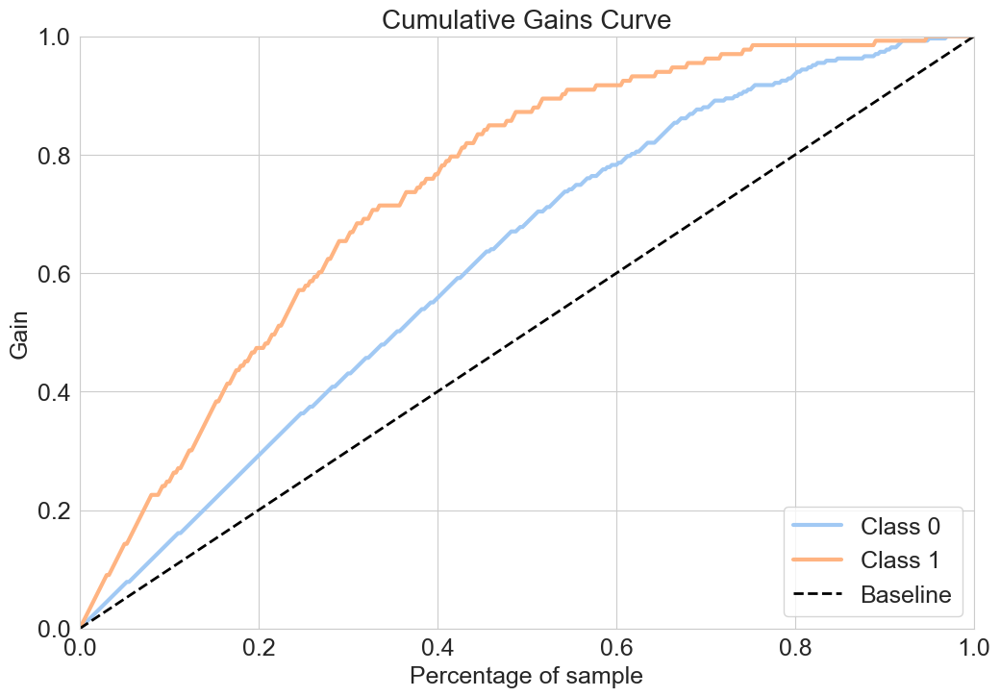

In [46]:
# Plot the Cumulative Gains Curve
skplt.metrics.plot_cumulative_gain(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

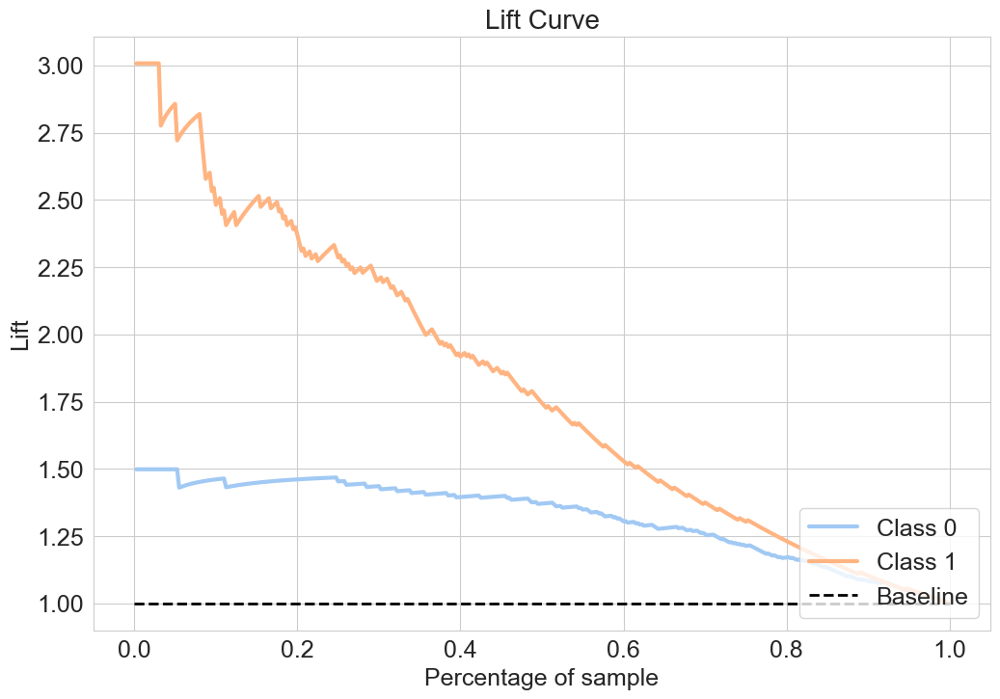

In [47]:
# Plot the Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

## Basic XGBoost

In [48]:
data_path = Path.cwd().parent / "data"
X_train = pd.read_csv(data_path / "X_train.csv")
y_train = pd.read_csv(data_path / "y_train.csv")
X_test = pd.read_csv(data_path / "X_test.csv")
y_test = pd.read_csv(data_path / "y_test.csv")

In [58]:
# Fit initial XGBoost model for feature selection
xgb_classifier = XGBClassifier(random_state=42, verbosity=0)
xgb_classifier.fit(X_train, y_train)

# Feature selection using SelectFromModel
sfm = SelectFromModel(xgb_classifier)
sfm.fit(X_train, y_train)
X_train_selected = sfm.transform(X_train)
X_test_selected = sfm.transform(X_test)

# Hyperparameter tuning using RandomizedSearchCV
param_dist = {
    'n_estimators': np.arange(50, 500, 50),
    'max_depth': np.arange(2, 10),
    'learning_rate': np.arange(0.01, 0.1, 0.02),
    'subsample': np.arange(0.5, 1.0, 0.1),
    'colsample_bytree': np.arange(0.4, 1.0, 0.1),
    'reg_alpha': [0, 0.001, 0.01, 0.1, 1, 10],
    'reg_lambda': [0, 0.001, 0.01, 0.1, 1, 10],
}

n_iter_search = 20

xgb_classifier = XGBClassifier(random_state=42, verbosity=0)
random_search = RandomizedSearchCV(
    xgb_classifier, param_distributions=param_dist, n_iter=n_iter_search,
    cv=StratifiedKFold(n_splits=5), scoring='balanced_accuracy', random_state=42
)
random_search.fit(X_train_selected, y_train)

best_params_xgb = random_search.best_params_

# Train the final model with the best hyperparameters
x_model = XGBClassifier(
    random_state=42,
    verbosity=0,
    **best_params_xgb
)
x_model.fit(
    X_train_selected,
    y_train,
    eval_set=[(X_test_selected, y_test)],
    eval_metric="aucpr",  
    early_stopping_rounds=20,
)

[0]	validation_0-aucpr:0.67297
[1]	validation_0-aucpr:0.74124
[2]	validation_0-aucpr:0.74165
[3]	validation_0-aucpr:0.73181
[4]	validation_0-aucpr:0.74291
[5]	validation_0-aucpr:0.74340
[6]	validation_0-aucpr:0.74345
[7]	validation_0-aucpr:0.76096
[8]	validation_0-aucpr:0.75112
[9]	validation_0-aucpr:0.75424
[10]	validation_0-aucpr:0.75179
[11]	validation_0-aucpr:0.75022
[12]	validation_0-aucpr:0.75199
[13]	validation_0-aucpr:0.75852
[14]	validation_0-aucpr:0.76200
[15]	validation_0-aucpr:0.77083
[16]	validation_0-aucpr:0.77243
[17]	validation_0-aucpr:0.77353
[18]	validation_0-aucpr:0.77463
[19]	validation_0-aucpr:0.77870
[20]	validation_0-aucpr:0.78619
[21]	validation_0-aucpr:0.78684
[22]	validation_0-aucpr:0.78685
[23]	validation_0-aucpr:0.79342
[24]	validation_0-aucpr:0.79655
[25]	validation_0-aucpr:0.79382
[26]	validation_0-aucpr:0.79361
[27]	validation_0-aucpr:0.79305
[28]	validation_0-aucpr:0.79402
[29]	validation_0-aucpr:0.79637
[30]	validation_0-aucpr:0.80075
[31]	validation_0-

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.08999999999999998,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=150, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [59]:
X_train_final = X_train_selected.copy()
X_test_final = X_test_selected.copy()

In [60]:
# Evaluate the model
y_pr_train_proba = x_model.predict_proba(X_train_final)[:, 1]  
y_pr_train_binary = x_model.predict(X_train_final)

acc_train = accuracy_score(y_train, y_pr_train_binary)
acc_balanced_train = balanced_accuracy_score(y_train, y_pr_train_binary)
class_re = classification_report(y_train, y_pr_train_binary)
con_mat = confusion_matrix(y_train, y_pr_train_binary)
auc_train = roc_auc_score(y_train, y_pr_train_proba)

print("Confusion Matrix:\n", con_mat)
print("\n")
print("Accuracy of the model:", acc_train * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_train * 100)
print("\n")
print("Classification report:\n", class_re)
print("AUC of the model:", auc_train)

Confusion Matrix:
 [[1093   22]
 [  66  419]]


Accuracy of the model: 94.5


Balanced accuracy of the model: 92.209329203458


Classification report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96      1115
           1       0.95      0.86      0.90       485

    accuracy                           0.94      1600
   macro avg       0.95      0.92      0.93      1600
weighted avg       0.95      0.94      0.94      1600

AUC of the model: 0.9902695205954418


In [61]:
# Test the model
y_pr_test_proba = x_model.predict_proba(X_test_final)[:, 1]
y_pr_test_binary = x_model.predict(X_test_final)

acc_test = accuracy_score(y_test, y_pr_test_binary)
acc_balanced_test = balanced_accuracy_score(y_test, y_pr_test_binary)
class_re1 = classification_report(y_test, y_pr_test_binary)
con_mat1 = confusion_matrix(y_test, y_pr_test_binary)
auc_test = roc_auc_score(y_test, y_pr_test_proba)

print("Confusion Matrix:\n", con_mat1)
print("\n")
print("Accuracy of the model:", acc_test * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_test * 100)
print("\n")
print("Classification report:\n", class_re1)
print("AUC of the model:", auc_test)

Confusion Matrix:
 [[246  21]
 [ 42  91]]


Accuracy of the model: 84.25


Balanced accuracy of the model: 80.27794204612655


Classification report:
               precision    recall  f1-score   support

           0       0.85      0.92      0.89       267
           1       0.81      0.68      0.74       133

    accuracy                           0.84       400
   macro avg       0.83      0.80      0.81       400
weighted avg       0.84      0.84      0.84       400

AUC of the model: 0.9037481343808961


## Random Forest

In [62]:
data_path = Path.cwd().parent / "data"
X_train = pd.read_csv(data_path / "X_train.csv")
y_train = pd.read_csv(data_path / "y_train.csv")
X_test = pd.read_csv(data_path / "X_test.csv")
y_test = pd.read_csv(data_path / "y_test.csv")

In [440]:
rf_classifier = RandomForestClassifier(random_state=42, verbose=0)
rf_classifier.fit(X_train, y_train)

sfm = SelectFromModel(rf_classifier)
sfm.fit(X_train, y_train)

X_train_selected_df = pd.DataFrame(sfm.transform(X_train), columns=X_train.columns[sfm.get_support(indices=True)])
X_test_selected_df = pd.DataFrame(sfm.transform(X_test), columns=X_train.columns[sfm.get_support(indices=True)])

# Hyperparameter tuning using RandomizedSearchCV
param_dist = {
    'n_estimators': np.arange(50, 500, 50),
    'max_depth': np.arange(2, 10),
    'min_samples_split': np.arange(2, 10),
    'min_samples_leaf': np.arange(1, 5),
    'max_features': ['auto', 'sqrt', 'log2'],
}

n_iter_search = 10

# Use the selected features for RandomizedSearchCV
random_search = RandomizedSearchCV(
    rf_classifier, param_distributions=param_dist, n_iter=n_iter_search,
    cv=StratifiedKFold(n_splits=10), scoring='balanced_accuracy', random_state=42
)
random_search.fit(X_train_selected_df, y_train)

best_params_rf = random_search.best_params_

rf_model = RandomForestClassifier(
    random_state=42,
    **best_params_rf
)
rf_model.fit(X_train_selected_df, y_train)

RandomForestClassifier(max_depth=8, min_samples_leaf=4, min_samples_split=7,
                       random_state=42)

In [441]:
best_params_rf

{'n_estimators': 100,
 'min_samples_split': 7,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 8}

In [442]:
X_train_final_rf = X_train_selected_df.copy()
X_test_final_rf = X_test_selected_df.copy()

In [443]:
# Evaluate the model
y_pr_train_proba = rf_model.predict_proba(X_train_final_rf)[:, 1]  
y_pr_train_binary = rf_model.predict(X_train_final_rf)

acc_train = accuracy_score(y_train, y_pr_train_binary)
acc_balanced_train = balanced_accuracy_score(y_train, y_pr_train_binary)
class_re = classification_report(y_train, y_pr_train_binary)
con_mat = confusion_matrix(y_train, y_pr_train_binary)
auc_train = roc_auc_score(y_train, y_pr_train_proba)

print("Confusion Matrix:\n", con_mat)
print("\n")
print("Accuracy of the model:", acc_train * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_train * 100)
print("\n")
print("Classification report:\n", class_re)
print("AUC of the model:", auc_train)

Confusion Matrix:
 [[1101   14]
 [ 163  322]]


Accuracy of the model: 88.9375


Balanced accuracy of the model: 82.56807359807684


Classification report:
               precision    recall  f1-score   support

           0       0.87      0.99      0.93      1115
           1       0.96      0.66      0.78       485

    accuracy                           0.89      1600
   macro avg       0.91      0.83      0.86      1600
weighted avg       0.90      0.89      0.88      1600

AUC of the model: 0.972718783227775


In [444]:
# Test the model
y_pr_test_proba = rf_model.predict_proba(X_test_final_rf)[:, 1]
y_pr_test_binary = rf_model.predict(X_test_final_rf)

acc_test = accuracy_score(y_test, y_pr_test_binary)
acc_balanced_test = balanced_accuracy_score(y_test, y_pr_test_binary)
class_re1 = classification_report(y_test, y_pr_test_binary)
con_mat1 = confusion_matrix(y_test, y_pr_test_binary)
auc_test = roc_auc_score(y_test, y_pr_test_proba)

print("Confusion Matrix:\n", con_mat1)
print("\n")
print("Accuracy of the model:", acc_test * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_test * 100)
print("\n")
print("Classification report:\n", class_re1)
print("AUC of the model:", auc_test)

Confusion Matrix:
 [[246  21]
 [ 66  67]]


Accuracy of the model: 78.25


Balanced accuracy of the model: 71.25538565514911


Classification report:
               precision    recall  f1-score   support

           0       0.79      0.92      0.85       267
           1       0.76      0.50      0.61       133

    accuracy                           0.78       400
   macro avg       0.77      0.71      0.73       400
weighted avg       0.78      0.78      0.77       400

AUC of the model: 0.8632254794289093


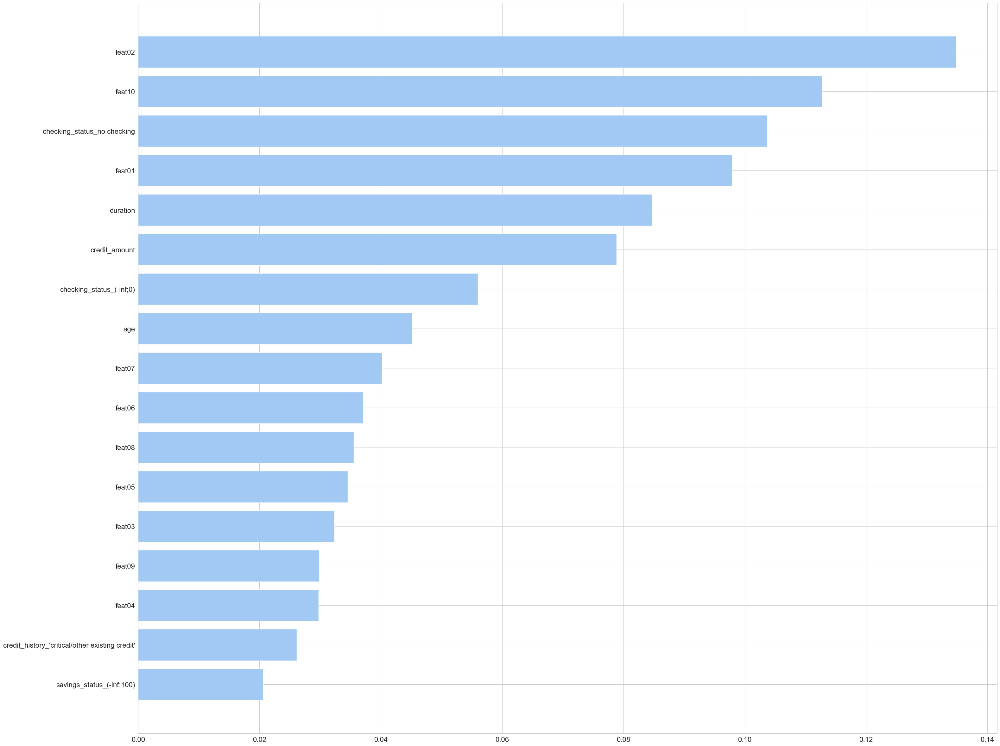

In [445]:
# Feature importance
sorted_idx = rf_model.feature_importances_.argsort()
plt.figure(figsize=(35, 30))
plt.barh(X_train_final_rf.columns[sorted_idx], rf_model.feature_importances_[sorted_idx])
plt.show()

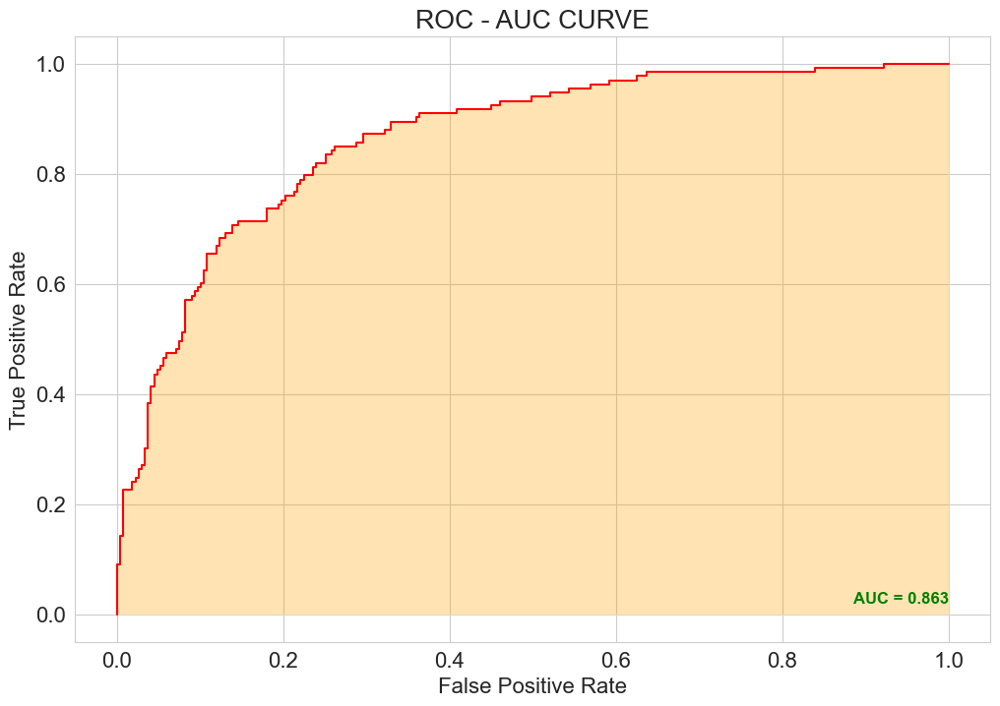

In [446]:
# Ploting the Roc - Auc Curve on Testing data
y_prob = rf_model.predict_proba(X_test_final_rf)
y_pr   = y_prob[:,1]
auc_score = roc_auc_score(y_test, y_pr)
fpr,tpr,threshold = roc_curve(y_test,y_pr)
plt.figure(figsize=(12, 8))
plt.plot(fpr,tpr, "r")
plt.text(1, 0.02, 'AUC = %0.3f' % auc_score, ha='right', fontsize=12,weight='bold', color='green')
plt.fill_between(fpr, tpr, facecolor='orange', alpha=0.3)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC - AUC CURVE")
plt.show()

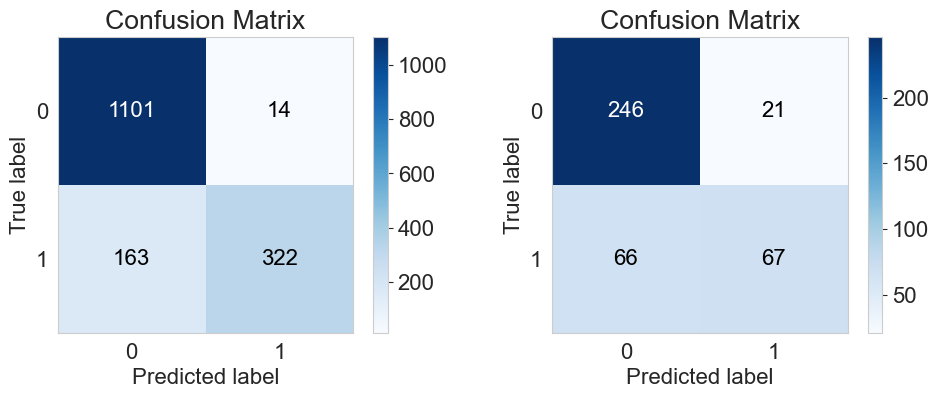

In [447]:
# Plot Confusion Matrix
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axes[0].set_title('Confusion Matrix - Train')
skplt.metrics.plot_confusion_matrix(y_train, y_pr_train_binary, ax=axes[0])
axes[1].set_title('Confusion Matrix - Test')
skplt.metrics.plot_confusion_matrix(y_test, y_pr_test_binary, ax=axes[1])

plt.tight_layout()
plt.show()

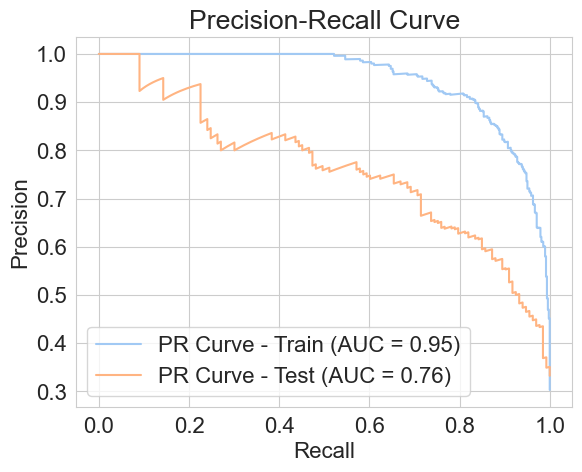

In [448]:
# Precision-Recall Curve
pr_auc_train = average_precision_score(y_train, y_pr_train_proba)
pr_auc_test = average_precision_score(y_test, y_pr_test_proba)

precision_train, recall_train, _ = precision_recall_curve(y_train, y_pr_train_proba)
precision_test, recall_test, _ = precision_recall_curve(y_test, y_pr_test_proba)

plt.plot(recall_train, precision_train, label=f'PR Curve - Train (AUC = {pr_auc_train:.2f})')
plt.plot(recall_test, precision_test, label=f'PR Curve - Test (AUC = {pr_auc_test:.2f})')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()


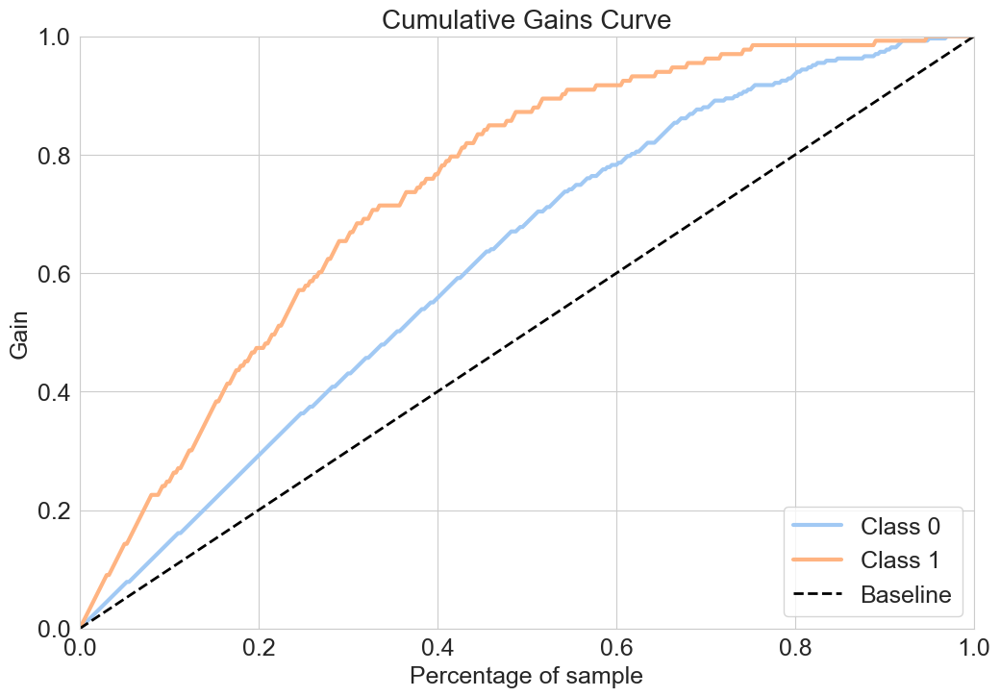

In [449]:
# Plot the Cumulative Gains Curve
skplt.metrics.plot_cumulative_gain(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

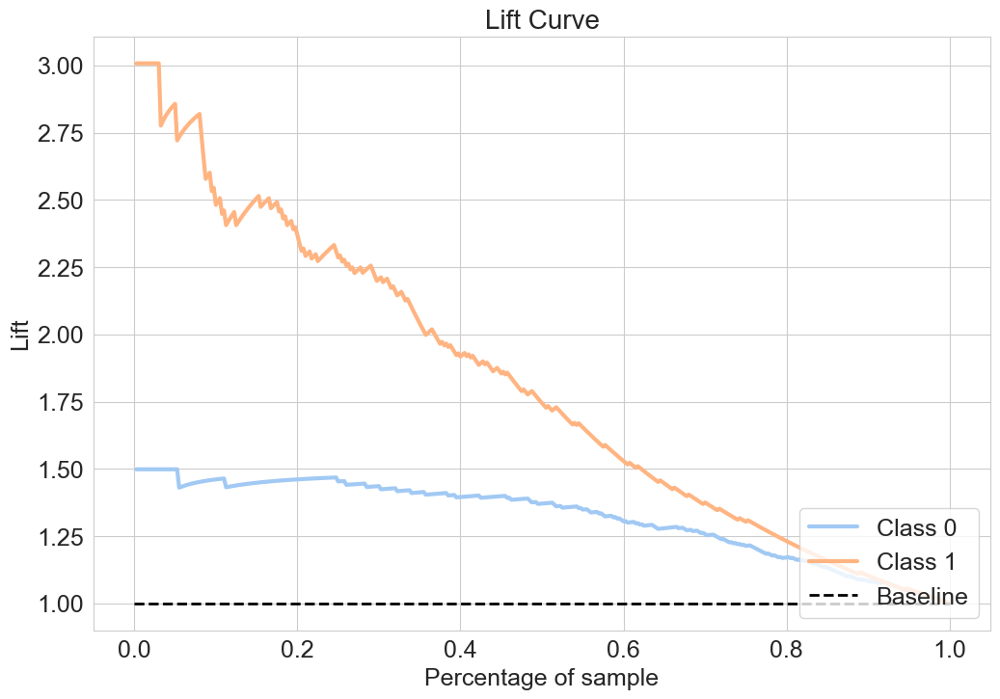

In [450]:
# Plot the Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

## CatBoost

In [106]:
data_path = Path.cwd().parent / "data"
X_train = pd.read_csv(data_path / "X_train.csv")
y_train = pd.read_csv(data_path / "y_train.csv")
X_test = pd.read_csv(data_path / "X_test.csv")
y_test = pd.read_csv(data_path / "y_test.csv")

In [107]:
from catboost import CatBoostClassifier
from sklearn.feature_selection import SelectFromModel

# Fit initial CatBoost model for feature selection
catboost_classifier = CatBoostClassifier(iterations=100, random_state=42, verbose=0)
catboost_classifier.fit(X_train, y_train)

# Feature selection using SelectFromModel
sfm = SelectFromModel(catboost_classifier)
sfm.fit(X_train, y_train)
X_train_selected = sfm.transform(X_train)
X_test_selected = sfm.transform(X_test)

# Hyperparameter tuning using RandomizedSearchCV
param_dist = {
    'iterations': np.arange(50, 500, 50),
    'depth': np.arange(2, 10),
    'learning_rate': np.arange(0.01, 0.1, 0.02),
    'subsample': np.arange(0.5, 1.0, 0.1),
    'colsample_bylevel': np.arange(0.4, 1.0, 0.1),
}

n_iter_search = 10

catboost_classifier = CatBoostClassifier(random_state=42, verbose=0)
random_search = RandomizedSearchCV(
    catboost_classifier, param_distributions=param_dist, n_iter=n_iter_search,
    cv=StratifiedKFold(n_splits=10), scoring='balanced_accuracy', random_state=42
)
random_search.fit(X_train_selected, y_train, cat_features=[])

best_params_catboost = random_search.best_params_

# Train the final model with the best hyperparameters
cat_model = CatBoostClassifier(
    random_state=42,
    verbose=0,
    iterations=1000,  
    **{k: v for k, v in best_params_catboost.items() if k != 'iterations'} 
)
cat_model.fit(
    X_train_selected,
    y_train,
    eval_set=(X_test_selected, y_test),  
    early_stopping_rounds=50,
    cat_features=[]
)


In [108]:
best_params_catboost

{'subsample': 0.7,
 'learning_rate': 0.08999999999999998,
 'iterations': 450,
 'depth': 6,
 'colsample_bylevel': 0.7999999999999999}

In [109]:
X_train_final_cat = X_train_selected.copy()
X_test_final_cat = X_test_selected.copy()

In [110]:
# Evaluate the model
y_pr_train_proba = cat_model.predict_proba(X_train_final_cat)[:, 1]  
y_pr_train_binary = cat_model.predict(X_train_final_cat)

acc_train = accuracy_score(y_train, y_pr_train_binary)
acc_balanced_train = balanced_accuracy_score(y_train, y_pr_train_binary)
class_re = classification_report(y_train, y_pr_train_binary)
con_mat = confusion_matrix(y_train, y_pr_train_binary)
auc_train = roc_auc_score(y_train, y_pr_train_proba)
auc_pr_train = average_precision_score(y_train, y_pr_train_proba)

print("Confusion Matrix:\n", con_mat)
print("\n")
print("Accuracy of the model:", acc_train * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_train * 100)
print("\n")
print("Classification report:\n", class_re)
print("AUC of the model:", auc_train)
print("AUC PR of the model:", auc_pr_train)

Confusion Matrix:
 [[1115    0]
 [   6  479]]


Accuracy of the model: 99.625


Balanced accuracy of the model: 99.38144329896907


Classification report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00      1115
           1       1.00      0.99      0.99       485

    accuracy                           1.00      1600
   macro avg       1.00      0.99      1.00      1600
weighted avg       1.00      1.00      1.00      1600

AUC of the model: 0.9999963016041792
AUC PR of the model: 0.9999915062498168


In [111]:
# Test the model
y_pr_test_proba = cat_model.predict_proba(X_test_final_cat)[:, 1]
y_pr_test_binary = cat_model.predict(X_test_final_cat)

acc_test = accuracy_score(y_test, y_pr_test_binary)
acc_balanced_test = balanced_accuracy_score(y_test, y_pr_test_binary)
class_re1 = classification_report(y_test, y_pr_test_binary)
con_mat1 = confusion_matrix(y_test, y_pr_test_binary)
auc_test = roc_auc_score(y_test, y_pr_test_proba)
auc_pr_test = average_precision_score(y_test, y_pr_test_proba)

print("Confusion Matrix:\n", con_mat1)
print("\n")
print("Accuracy of the model:", acc_test * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_test * 100)
print("\n")
print("Classification report:\n", class_re1)
print("AUC of the model:", auc_test)
print("AUC PR of the model:", auc_pr_test)

Confusion Matrix:
 [[241  26]
 [ 43  90]]


Accuracy of the model: 82.75


Balanced accuracy of the model: 78.96567260848751


Classification report:
               precision    recall  f1-score   support

           0       0.85      0.90      0.87       267
           1       0.78      0.68      0.72       133

    accuracy                           0.83       400
   macro avg       0.81      0.79      0.80       400
weighted avg       0.82      0.83      0.82       400

AUC of the model: 0.8962574976767763
AUC PR of the model: 0.8319555563724059


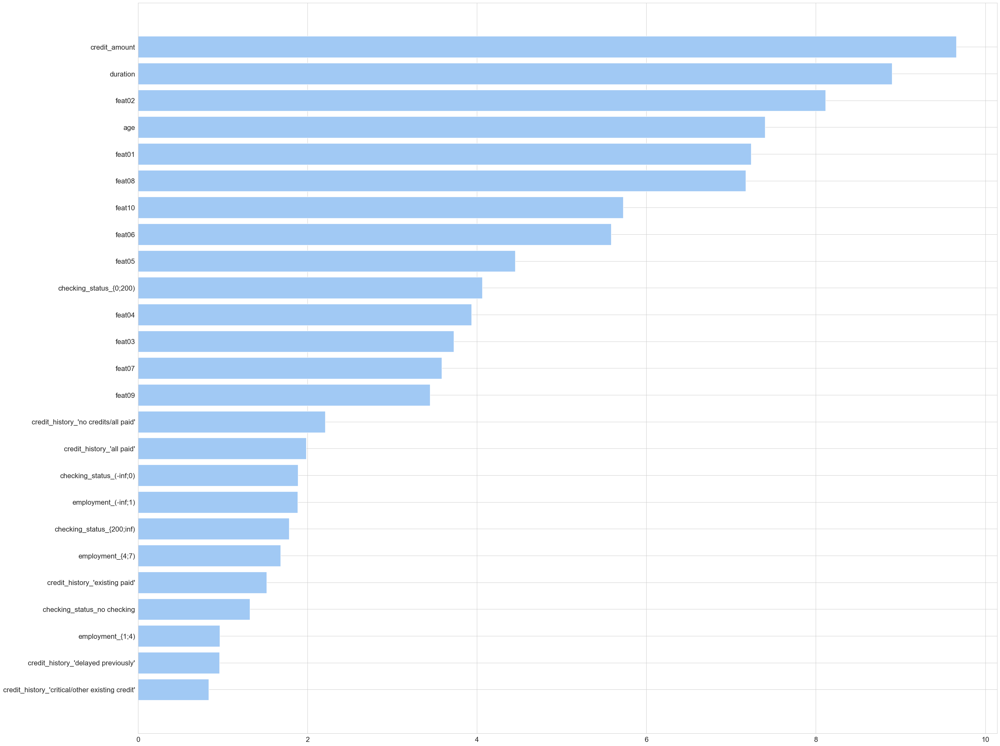

In [112]:
# Feature importance
sorted_idx = cat_model.feature_importances_.argsort()
plt.figure(figsize=(35, 30))
plt.barh(X_train.columns[sorted_idx], cat_model.feature_importances_[sorted_idx])
plt.show()

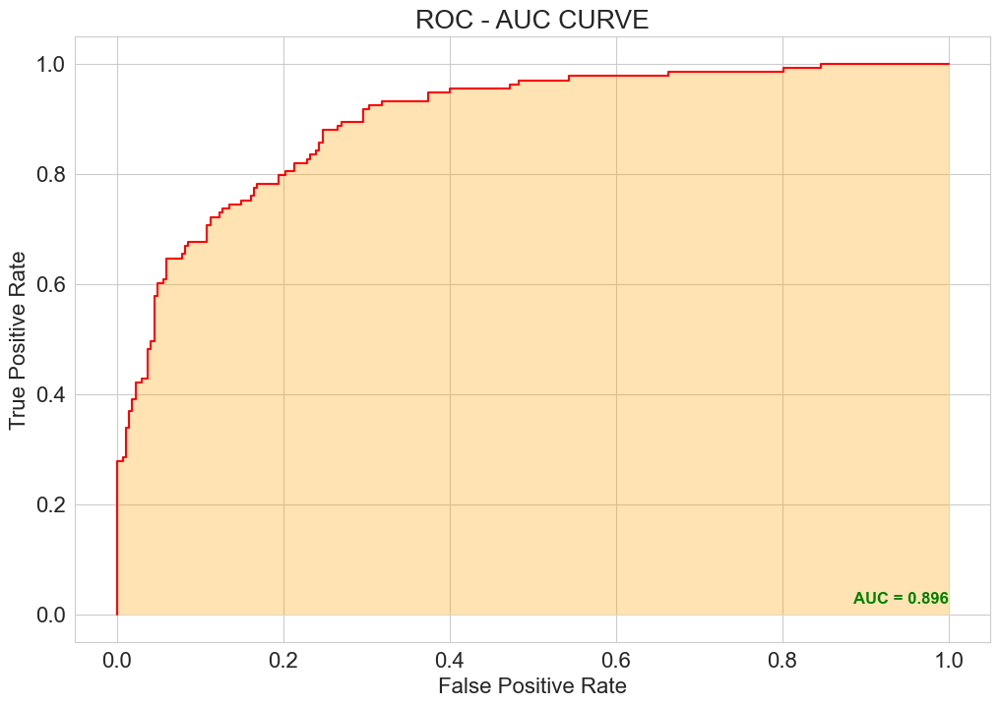

In [113]:
# Ploting the Roc - Auc Curve on Testing data
y_prob = cat_model.predict_proba(X_test_final_cat)
y_pr   = y_prob[:,1]
auc_score = roc_auc_score(y_test, y_pr)
fpr,tpr,threshold = roc_curve(y_test,y_pr)
plt.figure(figsize=(12, 8))
plt.plot(fpr,tpr, "r")
plt.text(1, 0.02, 'AUC = %0.3f' % auc_score, ha='right', fontsize=12,weight='bold', color='green')
plt.fill_between(fpr, tpr, facecolor='orange', alpha=0.3)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC - AUC CURVE")
plt.show()

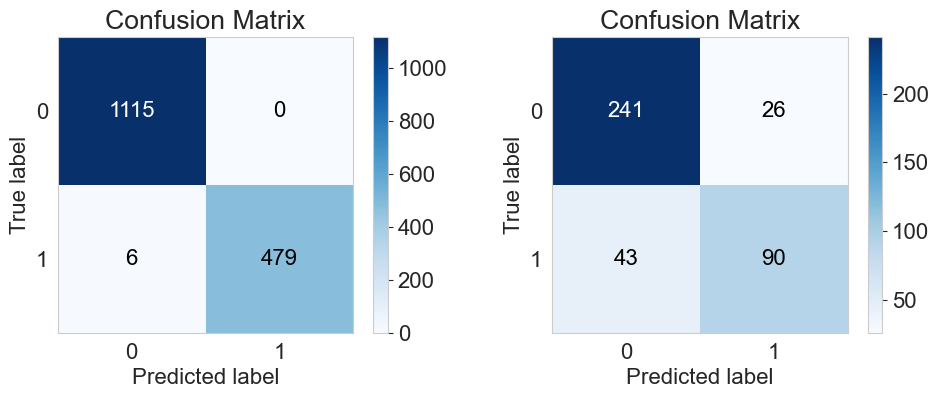

In [114]:
# Plot Confusion Matrix
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axes[0].set_title('Confusion Matrix - Train')
skplt.metrics.plot_confusion_matrix(y_train, y_pr_train_binary, ax=axes[0])
axes[1].set_title('Confusion Matrix - Test')
skplt.metrics.plot_confusion_matrix(y_test, y_pr_test_binary, ax=axes[1])

plt.tight_layout()
plt.show()

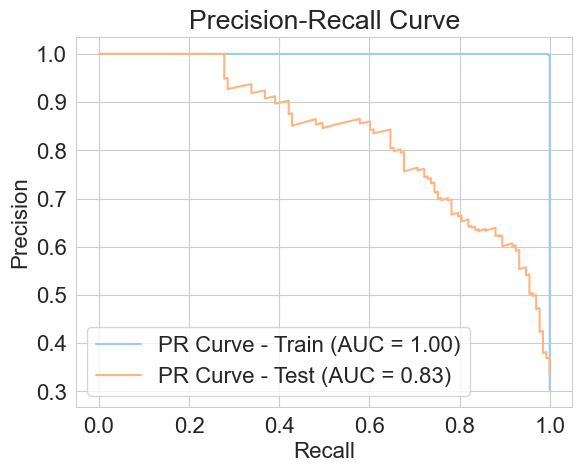

In [115]:
# Precision-Recall Curve
pr_auc_train = average_precision_score(y_train, y_pr_train_proba)
pr_auc_test = average_precision_score(y_test, y_pr_test_proba)

precision_train, recall_train, _ = precision_recall_curve(y_train, y_pr_train_proba)
precision_test, recall_test, _ = precision_recall_curve(y_test, y_pr_test_proba)

plt.plot(recall_train, precision_train, label=f'PR Curve - Train (AUC = {pr_auc_train:.2f})')
plt.plot(recall_test, precision_test, label=f'PR Curve - Test (AUC = {pr_auc_test:.2f})')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()


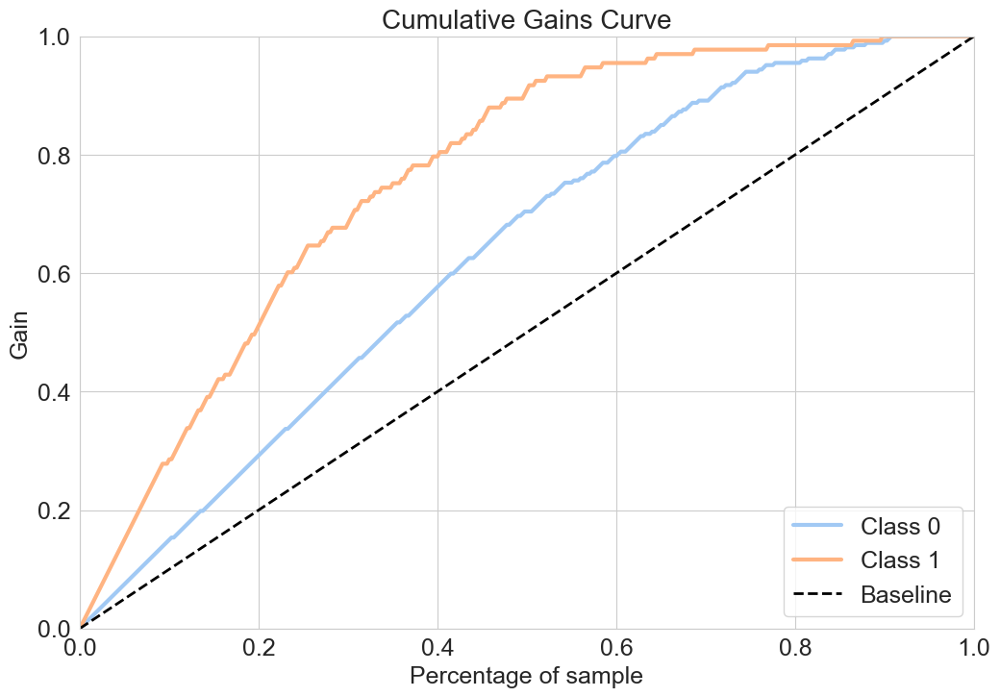

In [116]:
# Plot the Cumulative Gains Curve
skplt.metrics.plot_cumulative_gain(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

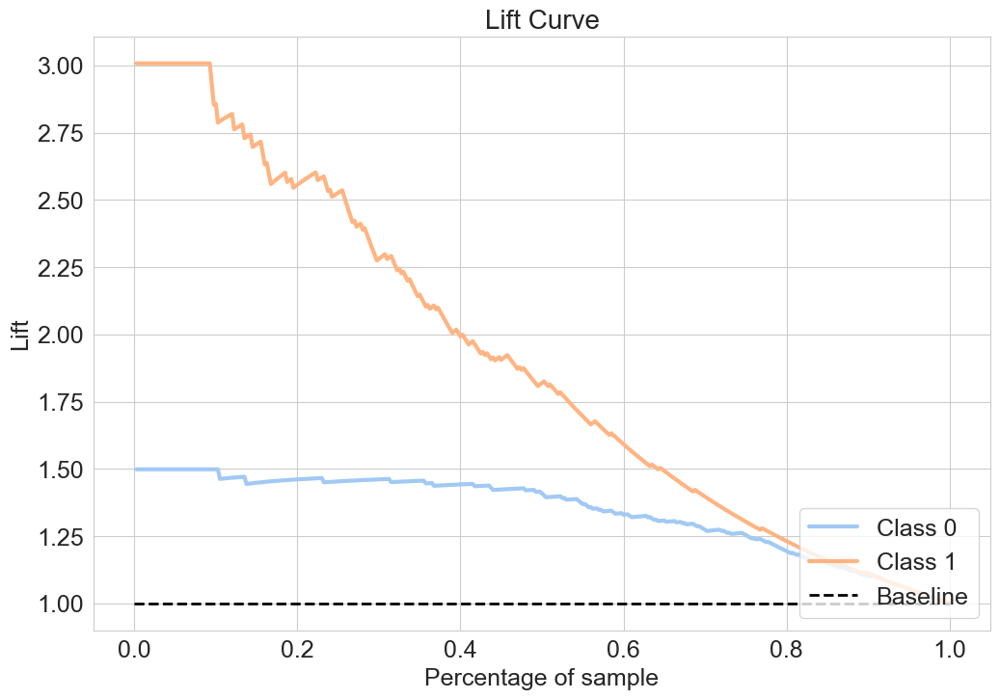

In [117]:
# Plot the Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

## ExtraTreesClassifier

In [118]:
data_path = Path.cwd().parent / "data"
X_train = pd.read_csv(data_path / "X_train.csv")
y_train = pd.read_csv(data_path / "y_train.csv")
X_test = pd.read_csv(data_path / "X_test.csv")
y_test = pd.read_csv(data_path / "y_test.csv")

In [119]:
from sklearn.ensemble import ExtraTreesClassifier

feature_selector = ExtraTreesClassifier(n_estimators=100, random_state=42)
feature_selector.fit(X_train, y_train)

sfm = SelectFromModel(feature_selector, threshold='median')
sfm.fit(X_train, y_train)
X_train_selected = sfm.transform(X_train)
X_test_selected = sfm.transform(X_test)

param_dist = {
    'n_estimators': np.arange(50, 500, 50),
    'max_depth': np.arange(2, 10, 2),
    'min_samples_split': np.arange(2, 10, 2),
    'min_samples_leaf': np.arange(1, 5, 1),
}

n_iter_search = 10

et_classifier = ExtraTreesClassifier(random_state=42)
random_search = RandomizedSearchCV(
    et_classifier, param_distributions=param_dist, n_iter=n_iter_search,
    cv=StratifiedKFold(n_splits=5), scoring='balanced_accuracy', random_state=42
)
random_search.fit(X_train_selected, y_train)

extra_trees_best_params = random_search.best_params_

extra_trees_model = ExtraTreesClassifier(random_state=42, **extra_trees_best_params)
extra_trees_model.fit(X_train_selected, y_train)

ExtraTreesClassifier(max_depth=8, min_samples_leaf=2, min_samples_split=8,
                     n_estimators=200, random_state=42)

In [120]:
X_train_final_extra_trees = X_train_selected.copy()
X_test_final_extra_trees = X_test_selected.copy()

In [121]:
# Evaluate the model
y_pr_train_proba = extra_trees_model.predict_proba(X_train_final_extra_trees)[:, 1]  
y_pr_train_binary = extra_trees_model.predict(X_train_final_extra_trees)

acc_train = accuracy_score(y_train, y_pr_train_binary)
acc_balanced_train = balanced_accuracy_score(y_train, y_pr_train_binary)
class_re = classification_report(y_train, y_pr_train_binary)
con_mat = confusion_matrix(y_train, y_pr_train_binary)
auc_train = roc_auc_score(y_train, y_pr_train_proba)
auc_pr_train = average_precision_score(y_train, y_pr_train_proba)

print("Confusion Matrix:\n", con_mat)
print("\n")
print("Accuracy of the model:", acc_train * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_train * 100)
print("\n")
print("Classification report:\n", class_re)
print("AUC of the model:", auc_train)
print("AUC PR of the model:", auc_pr_train)

Confusion Matrix:
 [[1104   11]
 [ 109  376]]


Accuracy of the model: 92.5


Balanced accuracy of the model: 88.26961305533725


Classification report:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95      1115
           1       0.97      0.78      0.86       485

    accuracy                           0.93      1600
   macro avg       0.94      0.88      0.91      1600
weighted avg       0.93      0.93      0.92      1600

AUC of the model: 0.9850177985298877
AUC PR of the model: 0.9717176150823976


In [122]:
# Test the model
y_pr_test_proba = extra_trees_model.predict_proba(X_test_final_extra_trees)[:, 1]
y_pr_test_binary = extra_trees_model.predict(X_test_final_extra_trees)

acc_test = accuracy_score(y_test, y_pr_test_binary)
acc_balanced_test = balanced_accuracy_score(y_test, y_pr_test_binary)
class_re1 = classification_report(y_test, y_pr_test_binary)
con_mat1 = confusion_matrix(y_test, y_pr_test_binary)
auc_test = roc_auc_score(y_test, y_pr_test_proba)
auc_pr_test = average_precision_score(y_test, y_pr_test_proba)

print("Confusion Matrix:\n", con_mat1)
print("\n")
print("Accuracy of the model:", acc_test * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_test * 100)
print("\n")
print("Classification report:\n", class_re1)
print("AUC of the model:", auc_test)
print("AUC PR of the model:", auc_pr_test)

Confusion Matrix:
 [[257  10]
 [ 59  74]]


Accuracy of the model: 82.75


Balanced accuracy of the model: 75.94688969615049


Classification report:
               precision    recall  f1-score   support

           0       0.81      0.96      0.88       267
           1       0.88      0.56      0.68       133

    accuracy                           0.83       400
   macro avg       0.85      0.76      0.78       400
weighted avg       0.84      0.83      0.82       400

AUC of the model: 0.9231224127735068
AUC PR of the model: 0.8451060183375707


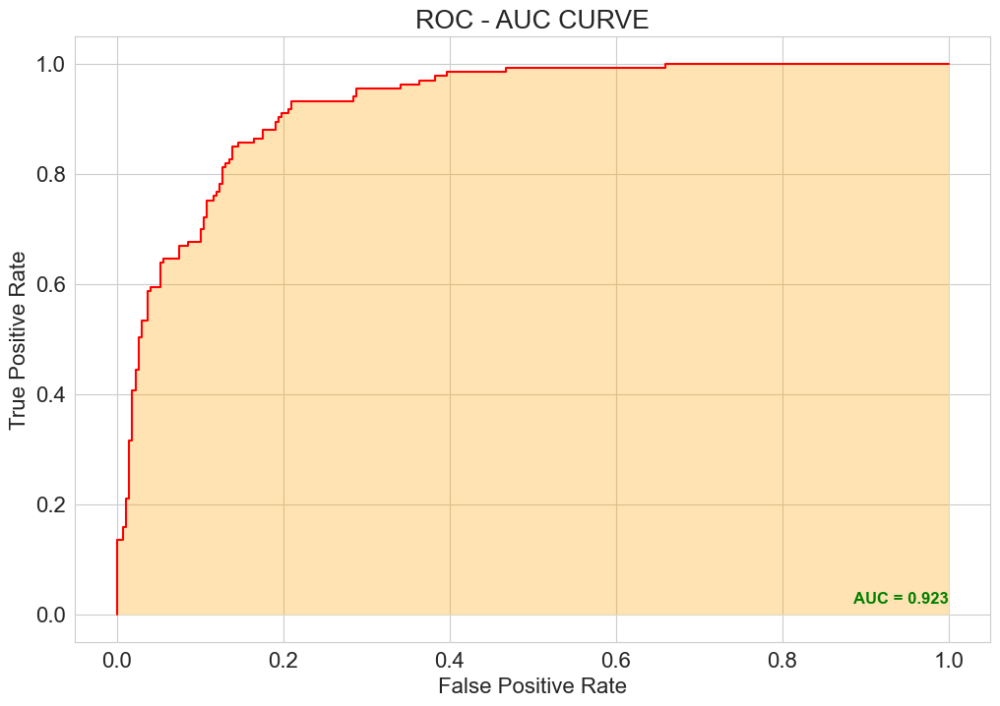

In [123]:
# Ploting the Roc - Auc Curve on Testing data
y_prob = extra_trees_model.predict_proba(X_test_final_extra_trees)
y_pr   = y_prob[:,1]
auc_score = roc_auc_score(y_test, y_pr)
fpr,tpr,threshold = roc_curve(y_test,y_pr)
plt.figure(figsize=(12, 8))
plt.plot(fpr,tpr, "r")
plt.text(1, 0.02, 'AUC = %0.3f' % auc_score, ha='right', fontsize=12,weight='bold', color='green')
plt.fill_between(fpr, tpr, facecolor='orange', alpha=0.3)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC - AUC CURVE")
plt.show()

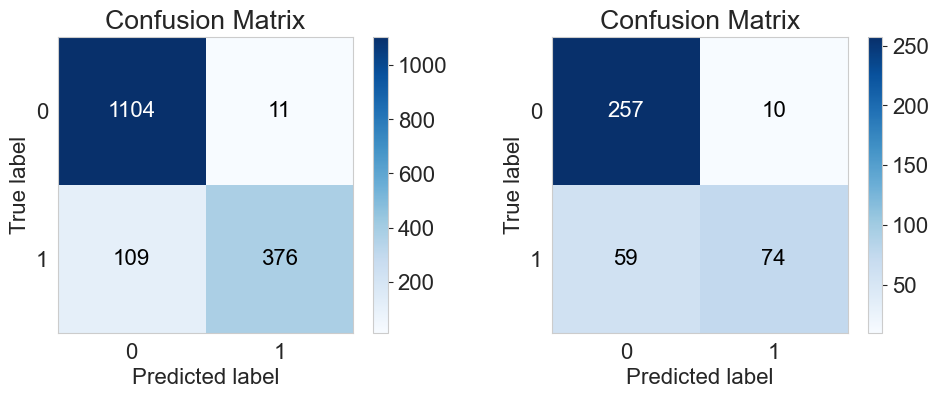

In [124]:
# Plot Confusion Matrix
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axes[0].set_title('Confusion Matrix - Train')
skplt.metrics.plot_confusion_matrix(y_train, y_pr_train_binary, ax=axes[0])
axes[1].set_title('Confusion Matrix - Test')
skplt.metrics.plot_confusion_matrix(y_test, y_pr_test_binary, ax=axes[1])

plt.tight_layout()
plt.show()

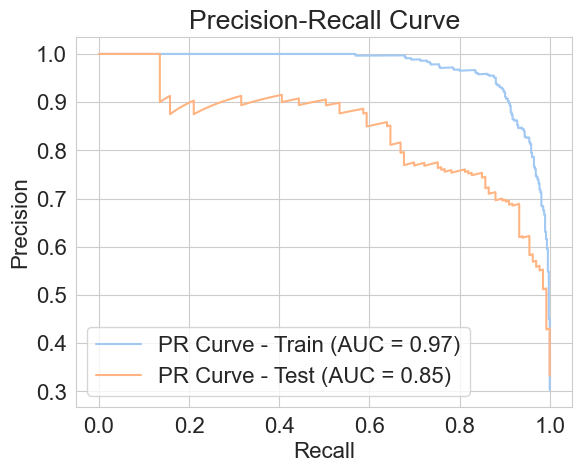

In [125]:
# Precision-Recall Curve
pr_auc_train = average_precision_score(y_train, y_pr_train_proba)
pr_auc_test = average_precision_score(y_test, y_pr_test_proba)

precision_train, recall_train, _ = precision_recall_curve(y_train, y_pr_train_proba)
precision_test, recall_test, _ = precision_recall_curve(y_test, y_pr_test_proba)

plt.plot(recall_train, precision_train, label=f'PR Curve - Train (AUC = {pr_auc_train:.2f})')
plt.plot(recall_test, precision_test, label=f'PR Curve - Test (AUC = {pr_auc_test:.2f})')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()


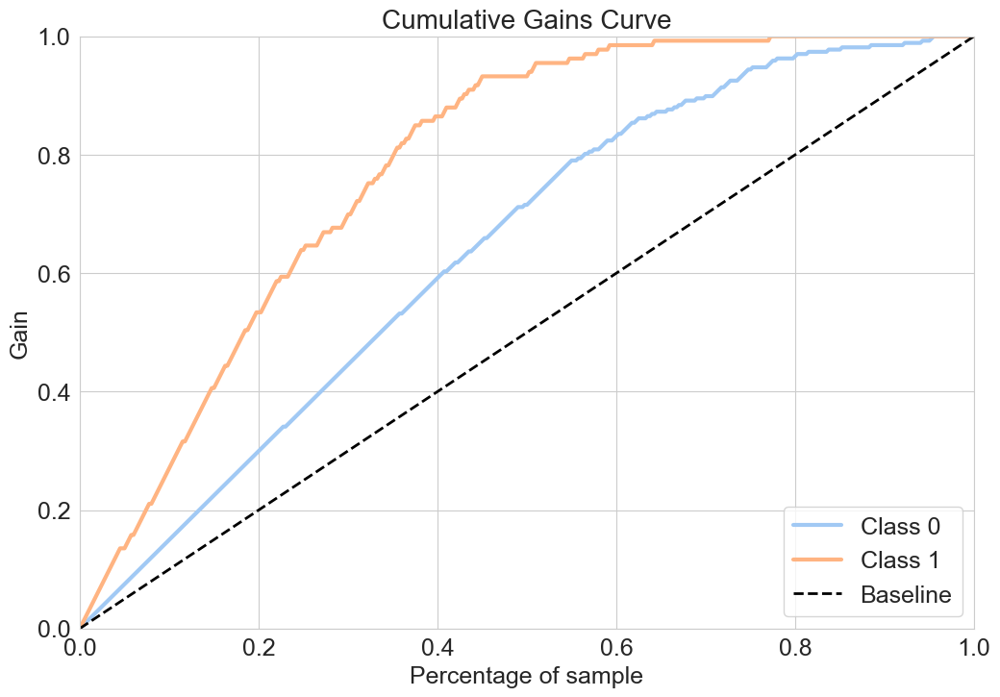

In [126]:
# Plot the Cumulative Gains Curve
skplt.metrics.plot_cumulative_gain(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

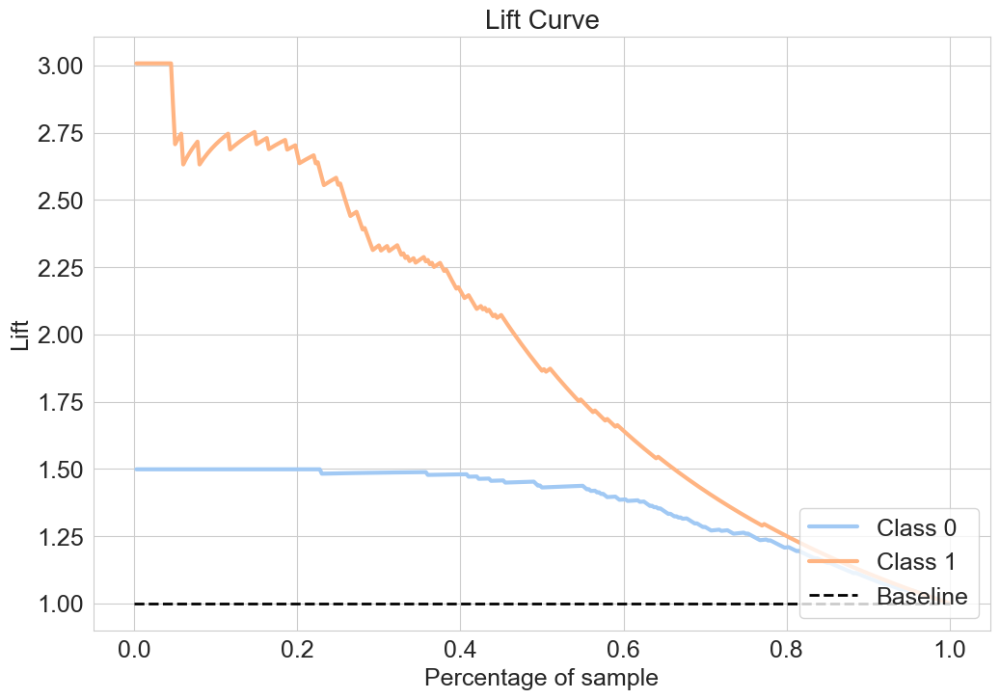

In [127]:
# Plot the Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

## Deep dive into XGBoost

### Handling Class Imbalance with `scale_pos_weight`

One of the key challenges in binary classification tasks with imbalanced classes is ensuring that the model learns effectively from the minority class. XGBoost offers a useful parameter called `scale_pos_weight` to address this issue. This parameter adjusts the balance of positive and negative class instances by assigning weights to positive examples. By default, `scale_pos_weight` is set to 1, assuming a balanced class distribution. However, in cases of severe class imbalance, setting `scale_pos_weight` to a value greater than 1 can help the model prioritize the minority class during training.

In the presented XGBoost model, the `scale_pos_weight` parameter is calculated based on the class distribution in the training data. It is computed as the ratio of negative to positive class instances:

scale_pos_weight = (y_train.shape[0] - y_train.sum()[0]) / y_train.sum()[0]

This calculation ensures that the model assigns higher weight to positive class instances, thereby increasing their influence on the training process and improving the model's ability to capture patterns associated with the minority class.

### Feature Selection and Hyperparameter Tuning

#### Feature Selection with SelectFromModel

Before training the XGBoost model, feature selection is performed using the SelectFromModel method with an initial XGBoost classifier. This technique leverages the importance scores assigned to each feature by the classifier to select the most informative features for training. Features selected through this process are retained for subsequent model training steps.

#### Hyperparameter Tuning with RandomizedSearchCV

Hyperparameter tuning is crucial for optimizing the performance of the XGBoost model. RandomizedSearchCV is employed to efficiently explore the hyperparameter space and identify the combination of hyperparameters that maximizes the chosen evaluation metric. In this case, the hyperparameters include `n_estimators`, `max_depth`, `learning_rate`, `subsample`, `colsample_bytree`, and `colsample_bylevel`. The search is guided by the objective of maximizing the area under the ROC curve (ROC AUC) through 5-fold stratified cross-validation.

### Training and Evaluation

After identifying the best hyperparameters through random search, the final XGBoost model is trained using these optimal settings on the training data. The model's performance is evaluated on an independent test set using the area under the ROC curve (AUC) as the primary evaluation metric.

The trained XGBoost model achieves a test AUC of 0.907, indicating strong discriminatory power in distinguishing between positive and negative class instances. This performance underscores the effectiveness of the model in handling class imbalance and capturing relevant patterns in the data.

### Importance of Explainable Artificial Intelligence (XAI)

Explainable Artificial Intelligence (XAI) is pivotal in ensuring transparency and accountability in machine learning models. By providing insights into how models arrive at their predictions, XAI empowers stakeholders to understand, trust, and validate model decisions. This transparency is particularly critical in high-stakes domains such as healthcare, finance where decisions impact individuals' lives.

XAI helps uncover biases and discrimination inherent in models, allowing for fairer and more equitable decision-making. It enables model developers to identify and address potential flaws or unintended consequences early in the development process, mitigating risks and improving model performance.

Moreover, XAI fosters user trust and acceptance of AI systems by offering explanations in a human-understandable format. This enhances collaboration between humans and machines, enabling better-informed decisions and facilitating the integration of AI into various domains.

### Explaining Model Predictions with SHAP and Other Techniques

#### Interpreting Model Predictions with SHAP Summary Plot

The SHAP summary plot offers a comprehensive overview of feature influence within a predictive model, shedding light on both the significance and directionality of each feature's impact on the model's output. In the provided plot, features such as 'checking_status_no checking' and 'credit_history_critical/other existing credit' emerge as strong contributors to the model's predictions, with higher values associated with increased model output. This suggests that applicants with no checking status or a critical credit history are more likely to be deemed creditworthy according to the model.

Color coding enhances interpretation by visually representing feature values, with blue indicating lower values and pink/red denoting higher ones. Notably, 'duration' and undisclosed features labeled 'feat10' and 'feat01' also exert a positive influence on the model's predictions. The spread of SHAP values for each feature reflects their impact variability across different data points, with features like 'duration' exhibiting a broad distribution, indicating sensitivity to this feature across the dataset.

Conversely, features like 'job_skilled' and 'purpose_radio/tv' appear to play a minor role in influencing the model's predictions, as evidenced by their position at the bottom of the plot. The density of dots, particularly in vertically stacked regions, suggests patterns within the dataset that the model has learned to capture.

In summary, the SHAP summary plot provides invaluable insights into the dynamics of the model, elucidating not only the importance of each feature but also their interactions in shaping predictions. Understanding these mechanisms is crucial for making informed decisions based on the model's outputs, allowing stakeholders to identify key factors driving predictions and assess their implications effectively.

#### Additional Techniques for Model Interpretability

In addition to SHAP, other techniques such as feature importances and Dalex summary plot or breakdown plot can further enhance our understanding of model predictions. Feature importances offer a simpler yet informative view of feature contributions, ranking features based on their importance in predicting the target variable.

Dalex summary plot provide a holistic view of model behavior by visualizing the impact of individual features on predictions across different subsets of the data. By exploring how model predictions vary across various feature combinations, these plots offer deeper insights into the model's decision-making process and can help identify potential biases or areas for improvement.

In [153]:
data_path = Path.cwd().parent / "data"
X_train = pd.read_csv(data_path / "X_train.csv")
y_train = pd.read_csv(data_path / "y_train.csv")
X_test = pd.read_csv(data_path / "X_test.csv")
y_test = pd.read_csv(data_path / "y_test.csv")

In [154]:
# Fit initial XGBoost model for feature selection
rf_classifier = XGBClassifier(random_state=42, verbose=0)
rf_classifier.fit(X_train, y_train)
sfm = SelectFromModel(rf_classifier)
sfm.fit(X_train, y_train)
X_train_selected = sfm.transform(X_train)
X_test_selected = sfm.transform(X_test)
selected_feature_indices = sfm.get_support(indices=True)
X_train_selected_df = pd.DataFrame(X_train_selected, columns=X_train.columns[selected_feature_indices])
X_test_selected_df = pd.DataFrame(X_test_selected, columns=X_train.columns[selected_feature_indices])

In [155]:
X_train_final_xgb = X_train_selected_df
X_test_final_xgb = X_test_selected_df

In [156]:
# Hyperparameter tuning using RandomizedSearchCV
def random_search(X, y, params, model, n_iter=10, n_splits=5, scoring='roc_auc', seed=42):

    random_search = RandomizedSearchCV(
        model,
        param_distributions=params,
        n_iter=n_iter,
        scoring=scoring,
        n_jobs=-1,
        cv=StratifiedKFold(n_splits=n_splits),
        random_state=seed,
        verbose=4
    )
    random_search.fit(X, y)

    results = {
        'best_params': random_search.best_params_,
        'best_score': random_search.best_score_,
        'cv_results': random_search.cv_results_
    }
    return results

In [157]:
# Train the final model with the best hyperparameters
scale_pos_weight = (y_train.shape[0] - y_train.sum()[0]) / y_train.sum()[0]

xgb_model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='aucpr', scale_pos_weight=scale_pos_weight)

params = {"n_estimators": [50,100,150,200,250,300,350,400],
             "max_depth": np.arange(2,10),
             "learning_rate": np.arange(0.01,0.1,0.02),
             'subsample': np.arange(0.5, 1.0, 0.1),
             'colsample_bytree': np.arange(0.4, 1.0, 0.1),
             'colsample_bylevel': np.arange(0.4, 1.0, 0.1)}

results = random_search(X_train_final_xgb, y_train, params, xgb_model, n_iter=60, n_splits=5, scoring='roc_auc', seed=42)

best_params = results['best_params']
best_score = results['best_score']

model = xgb.XGBClassifier(**best_params, random_state=42, objective='binary:logistic', eval_metric='aucpr', scale_pos_weight=scale_pos_weight)
model.fit(X_train_final_xgb, y_train)

y_pred = model.predict_proba(X_test_final_xgb)[:, 1]
auc = roc_auc_score(y_test, y_pred)

print(f"Best hyperparameters: {best_params}")
print(f"Best score: {best_score}")
print(f"Test AUC: {auc}")

Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best hyperparameters: {'subsample': 0.7, 'n_estimators': 300, 'max_depth': 9, 'learning_rate': 0.06999999999999999, 'colsample_bytree': 0.4, 'colsample_bylevel': 0.4}
Best score: 0.8972308261291666
Test AUC: 0.9072118498493424


In [158]:
# Fit the final model
xgb_model = xgb.XGBClassifier(subsample = 0.7, n_estimators = 300,
                        max_depth = 9, learning_rate = 0.07,
                        colsample_bytree = 0.4, colsample_bylevel = 0.4,
                        objective='binary:logistic', eval_metric='aucpr', scale_pos_weight=scale_pos_weight)
xgb_model.fit(X_train_final_xgb, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=0.4, colsample_bynode=None,
              colsample_bytree=0.4, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='aucpr', feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.07, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [159]:
# Evaluate the model

from sklearn.metrics import average_precision_score
y_pr_train_proba = xgb_model.predict_proba(X_train_final_xgb)[:, 1]  
y_pr_train_binary = xgb_model.predict(X_train_final_xgb)

acc_train = accuracy_score(y_train, y_pr_train_binary)
acc_balanced_train = balanced_accuracy_score(y_train, y_pr_train_binary)
class_re = classification_report(y_train, y_pr_train_binary)
con_mat = confusion_matrix(y_train, y_pr_train_binary)
auc_train = roc_auc_score(y_train, y_pr_train_proba)
auc_pr_train = average_precision_score(y_train, y_pr_train_proba)

print("Confusion Matrix:\n", con_mat)
print("\n")
print("Accuracy of the model:", acc_train * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_train * 100)
print("\n")
print("Classification report:\n", class_re)
print("AUC of the model:", auc_train)
print("AUC PR of the model:", auc_pr_train)

Confusion Matrix:
 [[1113    2]
 [   0  485]]


Accuracy of the model: 99.875


Balanced accuracy of the model: 99.91031390134529


Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1115
           1       1.00      1.00      1.00       485

    accuracy                           1.00      1600
   macro avg       1.00      1.00      1.00      1600
weighted avg       1.00      1.00      1.00      1600

AUC of the model: 0.9999963016041792
AUC PR of the model: 0.999991532420246


In [160]:
# Test the model
y_pr_test_proba = xgb_model.predict_proba(X_test_final_xgb)[:, 1]
y_pr_test_binary = xgb_model.predict(X_test_final_xgb)

acc_test = accuracy_score(y_test, y_pr_test_binary)
acc_balanced_test = balanced_accuracy_score(y_test, y_pr_test_binary)
class_re1 = classification_report(y_test, y_pr_test_binary)
con_mat1 = confusion_matrix(y_test, y_pr_test_binary)
auc_test = roc_auc_score(y_test, y_pr_test_proba)
auc_pr_test = average_precision_score(y_test, y_pr_test_proba)

print("Confusion Matrix:\n", con_mat1)
print("\n")
print("Accuracy of the model:", acc_test * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_test * 100)
print("\n")
print("Classification report:\n", class_re1)
print("AUC of the model:", auc_test)
print("AUC PR of the model:", auc_pr_test)

Confusion Matrix:
 [[235  32]
 [ 28 105]]


Accuracy of the model: 85.0


Balanced accuracy of the model: 83.48117484723043


Classification report:
               precision    recall  f1-score   support

           0       0.89      0.88      0.89       267
           1       0.77      0.79      0.78       133

    accuracy                           0.85       400
   macro avg       0.83      0.83      0.83       400
weighted avg       0.85      0.85      0.85       400

AUC of the model: 0.9163921038551436
AUC PR of the model: 0.8513775261868223


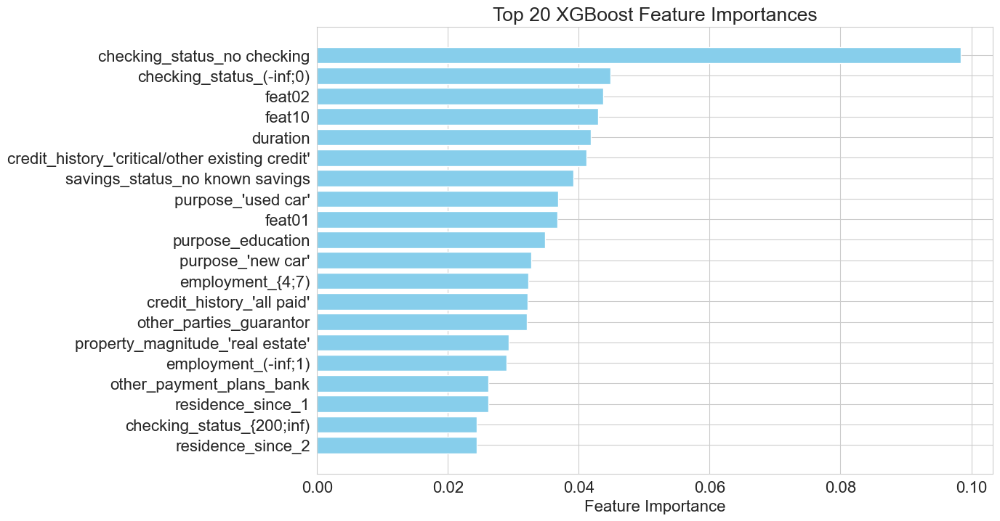

In [161]:
# Feature importance
sorted_idx = xgb_model.feature_importances_.argsort()
top_features = X_train_final_xgb.columns[sorted_idx][-20:]
plt.figure(figsize=(12, 8))
plt.barh(range(len(top_features)), xgb_model.feature_importances_[sorted_idx][-20:], align='center', color='skyblue')
plt.yticks(range(len(top_features)), top_features)
plt.xlabel('Feature Importance')
plt.title('Top 20 XGBoost Feature Importances')

plt.show()

In [162]:
# Dalex Explainer
import dalex as dx
xgb_exp = dx.Explainer(xgb_model, X_train_final_xgb, y_train)

Preparation of a new explainer is initiated

  -> data              : 1600 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.DataFrame. Converted to a numpy.ndarray.
  -> target variable   : 1600 values
  -> model_class       : xgboost.sklearn.XGBClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x000001E51EE0A2A0> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.000249, mean = 0.333, max = 0.998
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.652, mean = -0.0298, max = 0.485
  -> model_info        : package xgboost

A new explainer has been created!


In [163]:
# Plot the model profile
xgb_exp.model_profile().plot()

Calculating ceteris paribus: 100%|██████████| 32/32 [00:00<00:00, 40.67it/s]


In [164]:
# Plot variable importance
xgb_exp.model_parts().plot()

In [169]:
X_test_not_scaled = pd.read_csv(data_path / "X_test_not_scaled.csv")
X_test_not_scaled.iloc[[0,1]]

,age,credit_amount,duration,feat01,feat02,feat03,feat04,feat05,feat06,feat07,...,purpose_retraining,residence_since_1,residence_since_2,residence_since_3,residence_since_4,savings_status_{100;500),savings_status_{500;1000),savings_status_(-inf;100),savings_status_{1000;inf),savings_status_no known savings
0,42,3768,12,0.49,0.50,1.41,1.12,0.74,0.93,1.13,...,0,0,0,0,1,0,0,1,0,0
1,29,11659,45,0.55,0.63,1.26,1.27,0.98,0.98,1.20,...,0,0,0,0,1,0,0,1,0,0


In [ ]:
# Plot the Break Down plot
xgb_exp.predict_parts(new_observation = X_test_not_scaled.iloc[[0]], type = "break_down").plot()

In [ ]:
xgb_exp.predict_parts(new_observation = X_test_not_scaled.iloc[[1]], type = "break_down").plot()

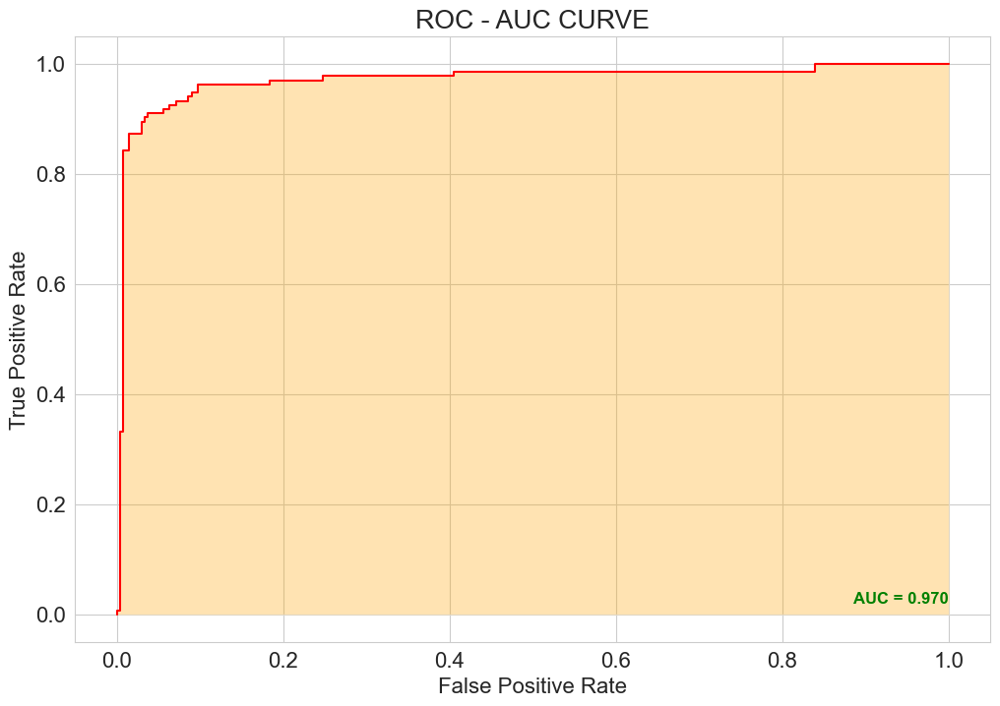

In [ ]:
# Ploting the Roc - Auc Curve on Testing data
y_prob = xgb_model.predict_proba(X_test_final_xgb)
y_pr   = y_prob[:,1]
auc_score = roc_auc_score(y_test, y_pr)
fpr,tpr,threshold = roc_curve(y_test,y_pr)
plt.figure(figsize=(12, 8))
plt.plot(fpr,tpr, "r")
plt.text(1, 0.02, 'AUC = %0.3f' % auc_score, ha='right', fontsize=12,weight='bold', color='green')
plt.fill_between(fpr, tpr, facecolor='orange', alpha=0.3)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC - AUC CURVE")
plt.show()

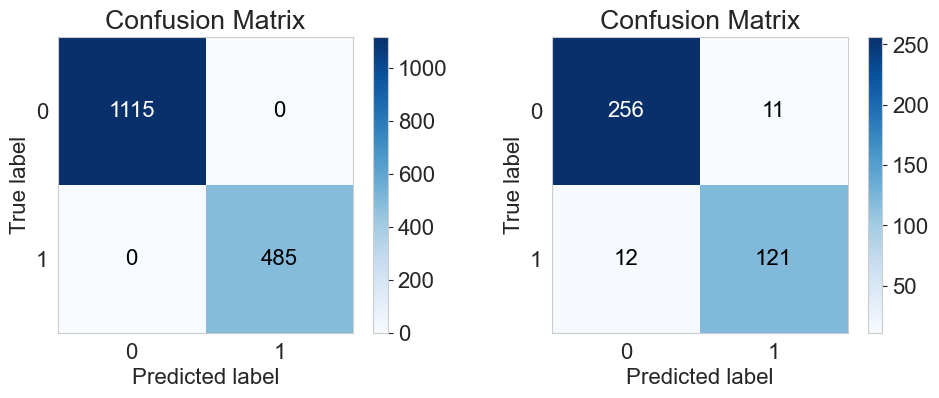

In [ ]:
# Plot Confusion Matrix
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axes[0].set_title('Confusion Matrix - Train')
skplt.metrics.plot_confusion_matrix(y_train, y_pr_train_binary, ax=axes[0])
axes[1].set_title('Confusion Matrix - Test')
skplt.metrics.plot_confusion_matrix(y_test, y_pr_test_binary, ax=axes[1])

plt.tight_layout()
plt.show()

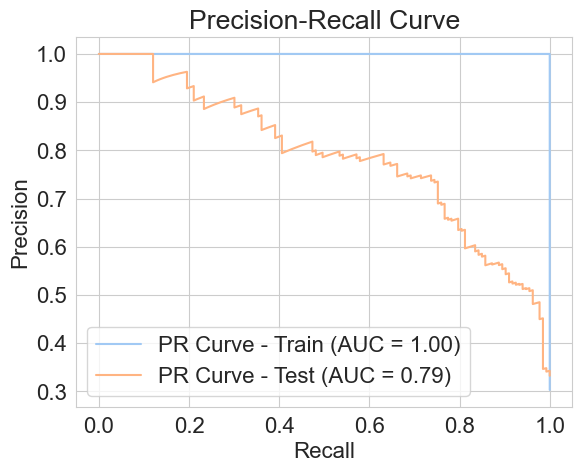

In [ ]:
# Precision-Recall Curve
from sklearn.metrics import precision_recall_curve, average_precision_score

pr_auc_train = average_precision_score(y_train, y_pr_train_proba)
pr_auc_test = average_precision_score(y_test, y_pr_test_proba)

precision_train, recall_train, _ = precision_recall_curve(y_train, y_pr_train_proba)
precision_test, recall_test, _ = precision_recall_curve(y_test, y_pr_test_proba)

plt.plot(recall_train, precision_train, label=f'PR Curve - Train (AUC = {pr_auc_train:.2f})')
plt.plot(recall_test, precision_test, label=f'PR Curve - Test (AUC = {pr_auc_test:.2f})')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()


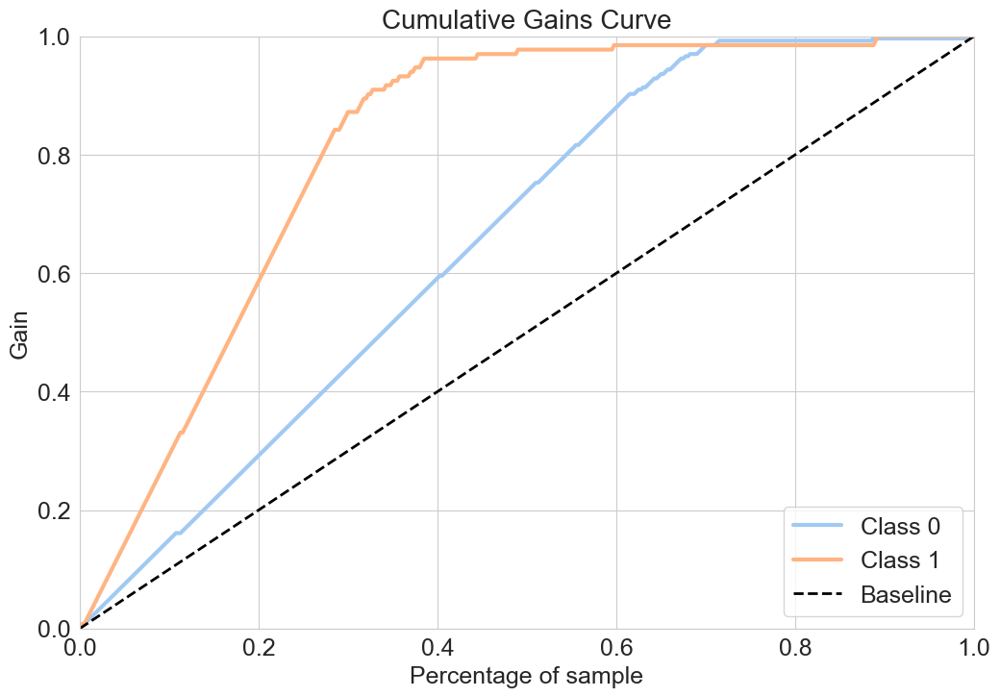

In [ ]:
# Plot the Cumulative Gains Curve
skplt.metrics.plot_cumulative_gain(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

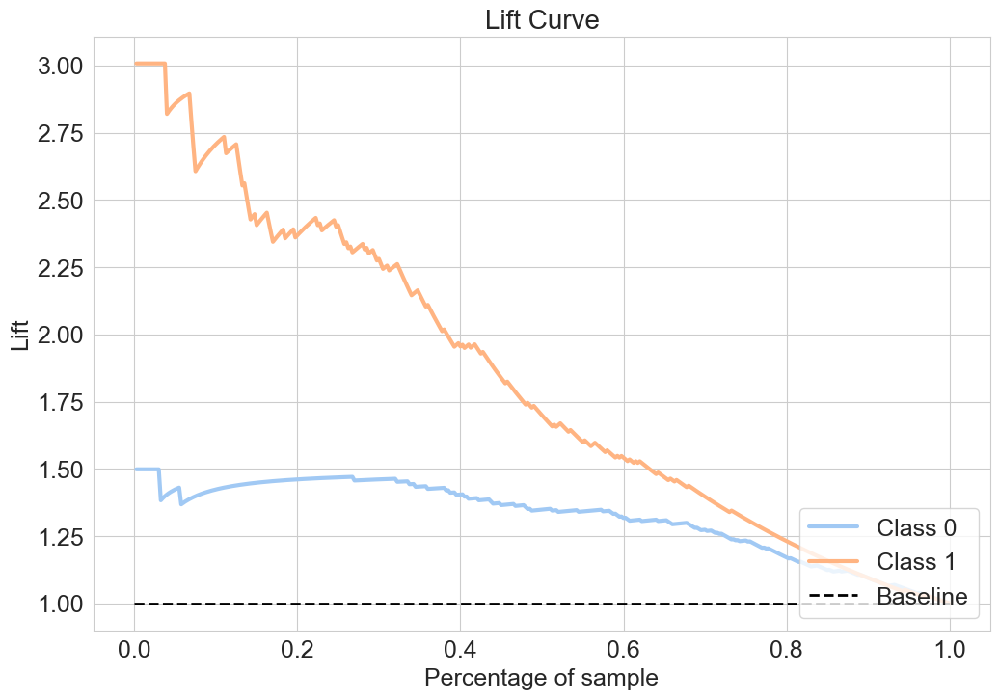

In [166]:
# Plot the Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

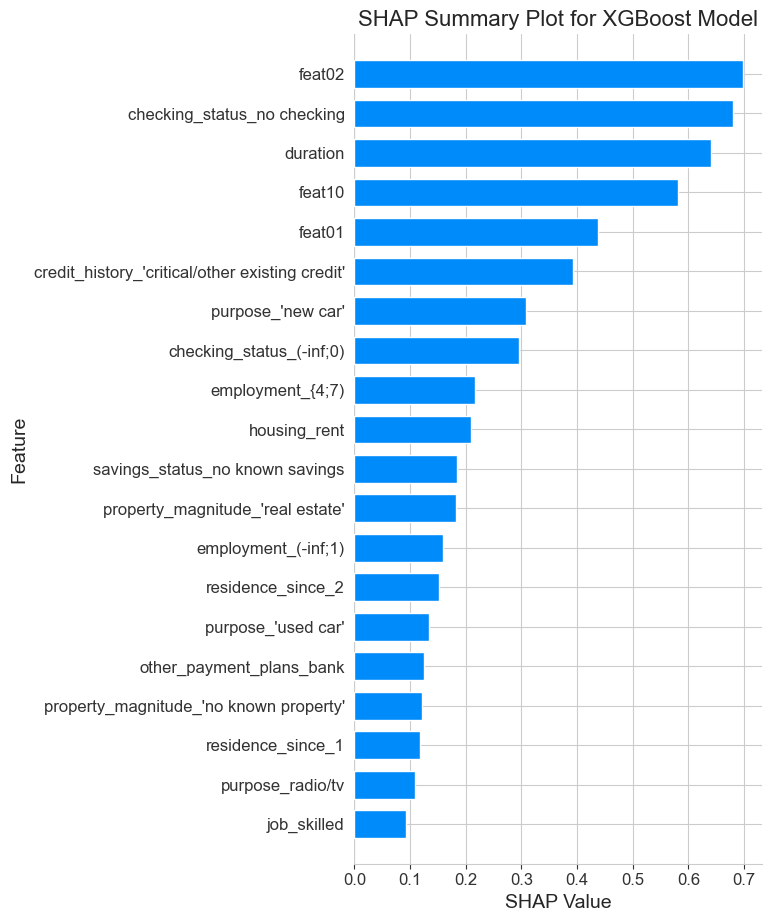

In [167]:
# SHAP values
import shap
import matplotlib.pyplot as plt

explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_test_final_xgb)

shap.summary_plot(shap_values, X_test_final_xgb, plot_type="bar", show=False)

plt.title("SHAP Summary Plot for XGBoost Model", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("SHAP Value", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.tight_layout()

plt.show()

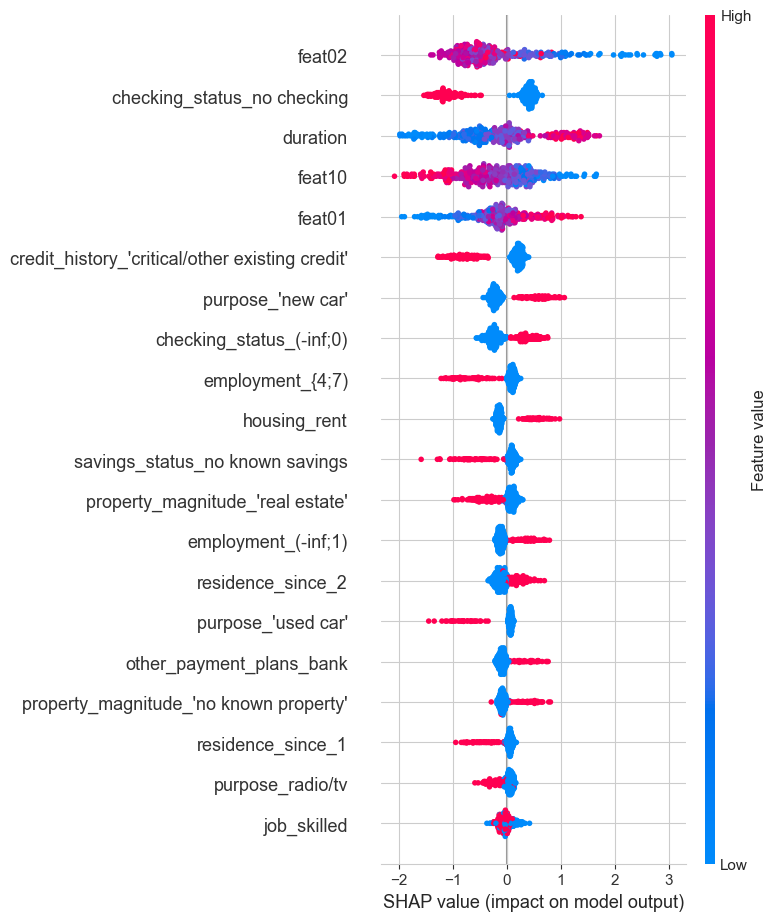

In [168]:
# SHAP Summary Plot
shap.summary_plot(shap_values, X_test_final_xgb)

### Enhancing Predictive Power with Ensemble Methods

In your modeling pipeline, ensemble methods like stacking and voting classifiers play a crucial role in leveraging the collective wisdom of multiple base models to improve predictive accuracy and robustness. Here's how these ensemble methods synergize with the comprehensive approach you've adopted:

#### Stacking Classifier with Model Aggregation

The stacking classifier integrates predictions from diverse base models, including Random Forest (RF), XGBoost (XGB), CatBoost, and Extra Trees, all fine-tuned with penalization hyperparameters identified through random search. These base models, crafted with optimized hyperparameters and selected features using techniques like forward selection with Random Forest, contribute their unique insights to the meta-learner, enhancing the overall predictive power.

On test data, the stacking classifier achieved an impressive balanced accuracy of 86.47% and an AUC of 0.952. The model demonstrates robust performance, with an accuracy of 89.5% and a balanced accuracy significantly higher than that of the individual models. The precision, recall, and f1-score metrics also indicate strong predictive capability across both classes.

#### Voting Classifier Harnessing Model Diversity

Similarly, the voting classifier aggregates predictions from RF, XGB, CatBoost, and Extra Trees models, each optimized through hyperparameter tuning and feature selection. Configured with parameters {'weights': None, 'voting': 'soft', 'flatten_transform': False}, the voting classifier achieves a balanced accuracy of 75.77% and an AUC of 0.87 on test data. While slightly lower in performance compared to the stacking classifier, the voting classifier still demonstrates competitive predictive power, with an accuracy of 81% and consistent precision and recall rates across both classes.

## Stacking

In [128]:
data_path = Path.cwd().parent / "data"
X_train = pd.read_csv(data_path / "X_train.csv")
y_train = pd.read_csv(data_path / "y_train.csv")
X_test = pd.read_csv(data_path / "X_test.csv")
y_test = pd.read_csv(data_path / "y_test.csv")

In [129]:
from sklearn.ensemble import StackingClassifier

# Base models
base_models = [
    ('random_forest', RandomForestClassifier(random_state=42, **best_params_rf)),
    ('xgboost', XGBClassifier(random_state=42, **best_params)),
    ('catboost', CatBoostClassifier(random_state=42, verbose=0, **best_params_catboost)),
    ('extra_trees', ExtraTreesClassifier(random_state=42, **extra_trees_best_params)),
]

# Train base models with best hyperparameters
for name, model in base_models:
    if name == 'random_forest':
        model.fit(X_train, y_train)
    else:
        sfm = SelectFromModel(model, threshold='median')
        sfm.fit(X_train, y_train)
        X_train_selected = sfm.transform(X_train)
        X_test_selected = sfm.transform(X_test)
        model.fit(X_train_selected, y_train)

meta_model_for_tuning = LogisticRegression(random_state=42)

sfm_meta_model = SelectFromModel(meta_model_for_tuning, threshold='median')
sfm_meta_model.fit(X_train_selected, y_train)
X_train_selected_meta_model = sfm_meta_model.transform(X_train_selected)

param_dist_meta_model = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
}

n_iter_search_meta_model = 5

random_search_meta_model = RandomizedSearchCV(
    meta_model_for_tuning, param_distributions=param_dist_meta_model, n_iter=n_iter_search_meta_model,
    cv=StratifiedKFold(n_splits=5), scoring='average_precision', random_state=42
)
random_search_meta_model.fit(X_train_selected_meta_model, y_train)

best_params_meta_model = random_search_meta_model.best_params_

meta_model = LogisticRegression(**best_params_meta_model)

stacking_classifier = StackingClassifier(estimators=base_models, final_estimator=meta_model)
stacking_classifier.fit(X_train_selected, y_train)


StackingClassifier(estimators=[('random_forest',
                                RandomForestClassifier(max_depth=8,
                                                       min_samples_leaf=4,
                                                       min_samples_split=7,
                                                       random_state=42)),
                               ('xgboost',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=0.4,
                                              colsample_bynode=None,
                                              colsample_bytree=0.4, device=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=...
                                              monotone_constraints=None,
                                              multi_strategy=None,
                                              n_estimators=300, n_jobs=None,
                                              num_parallel_tree=None,
                                              random_state=42, ...)),
                               ('catboost',
                                <catboost.core.CatBoostClassifier object at 0x000001E5295A7F10>),
                               ('extra_trees',
                                ExtraTreesClassifier(max_depth=8,
                                                     min_samples_leaf=2,
                                                     min_samples_split=8,
                                                     n_estimators=200,
                                                     random_state=42))],
                   final_estimator=LogisticRegression(C=10))

In [130]:
X_train_final_stacking = X_train_selected.copy()
X_test_final_stacking = X_test_selected.copy()

In [131]:
# Evaluate the model
y_pr_train_proba = stacking_classifier.predict_proba(X_train_final_stacking)[:, 1]  
y_pr_train_binary = stacking_classifier.predict(X_train_final_stacking)

acc_train = accuracy_score(y_train, y_pr_train_binary)
acc_balanced_train = balanced_accuracy_score(y_train, y_pr_train_binary)
class_re = classification_report(y_train, y_pr_train_binary)
con_mat = confusion_matrix(y_train, y_pr_train_binary)
auc_train = roc_auc_score(y_train, y_pr_train_proba)
auc_pr_train = average_precision_score(y_train, y_pr_train_proba)

print("Confusion Matrix:\n", con_mat)
print("\n")
print("Accuracy of the model:", acc_train * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_train * 100)
print("\n")
print("Classification report:\n", class_re)
print("AUC of the model:", auc_train)
print("AUC PR of the model:", auc_pr_train)

Confusion Matrix:
 [[1115    0]
 [   0  485]]


Accuracy of the model: 100.0


Balanced accuracy of the model: 100.0


Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1115
           1       1.00      1.00      1.00       485

    accuracy                           1.00      1600
   macro avg       1.00      1.00      1.00      1600
weighted avg       1.00      1.00      1.00      1600

AUC of the model: 1.0
AUC PR of the model: 1.0


In [132]:
# Test the model
y_pr_test_proba = stacking_classifier.predict_proba(X_test_final_stacking)[:, 1]
y_pr_test_binary = stacking_classifier.predict(X_test_final_stacking)

acc_test = accuracy_score(y_test, y_pr_test_binary)
acc_balanced_test = balanced_accuracy_score(y_test, y_pr_test_binary)
class_re1 = classification_report(y_test, y_pr_test_binary)
con_mat1 = confusion_matrix(y_test, y_pr_test_binary)
auc_test = roc_auc_score(y_test, y_pr_test_proba)
auc_pr_test = average_precision_score(y_test, y_pr_test_proba)

print("Confusion Matrix:\n", con_mat1)
print("\n")
print("Accuracy of the model:", acc_test * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_test * 100)
print("\n")
print("Classification report:\n", class_re1)
print("AUC of the model:", auc_test)
print("AUC PR of the model:", auc_pr_test)

Confusion Matrix:
 [[255  12]
 [ 30 103]]


Accuracy of the model: 89.5


Balanced accuracy of the model: 86.47461350004224


Classification report:
               precision    recall  f1-score   support

           0       0.89      0.96      0.92       267
           1       0.90      0.77      0.83       133

    accuracy                           0.90       400
   macro avg       0.90      0.86      0.88       400
weighted avg       0.90      0.90      0.89       400

AUC of the model: 0.9520711892089776
AUC PR of the model: 0.9125173828002305


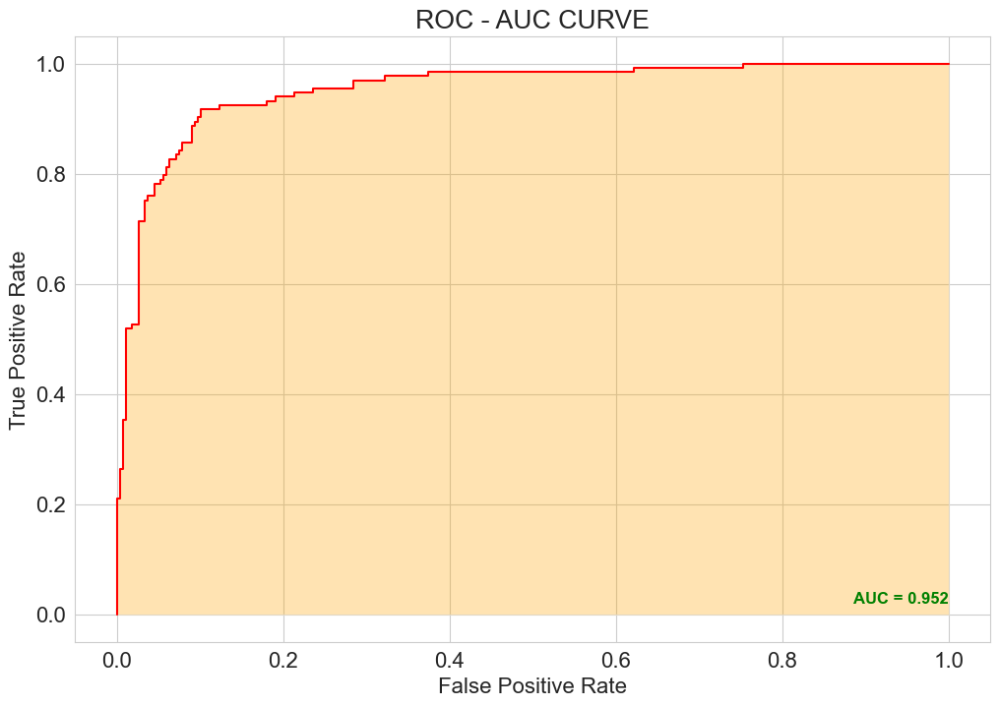

In [133]:
# Ploting the Roc - Auc Curve on Testing data
y_prob = stacking_classifier.predict_proba(X_test_final_stacking)
y_pr   = y_prob[:,1]
auc_score = roc_auc_score(y_test, y_pr)
fpr,tpr,threshold = roc_curve(y_test,y_pr)
plt.figure(figsize=(12, 8))
plt.plot(fpr,tpr, "r")
plt.text(1, 0.02, 'AUC = %0.3f' % auc_score, ha='right', fontsize=12,weight='bold', color='green')
plt.fill_between(fpr, tpr, facecolor='orange', alpha=0.3)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC - AUC CURVE")
plt.show()

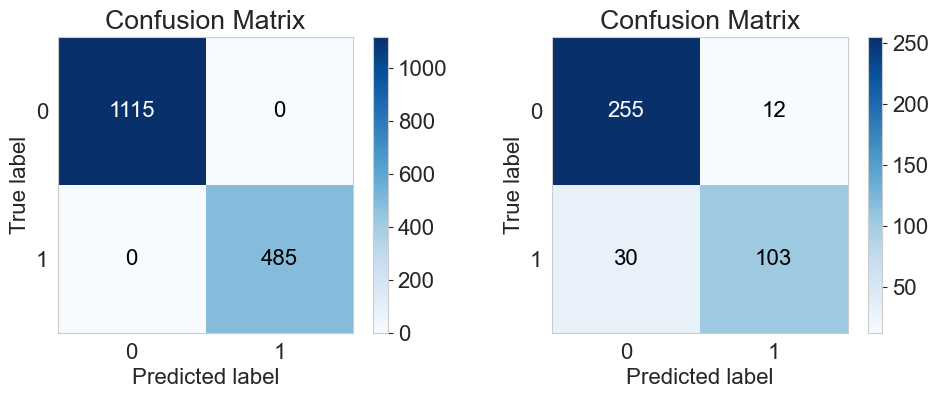

In [134]:
# Plot Confusion Matrix
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axes[0].set_title('Confusion Matrix - Train')
skplt.metrics.plot_confusion_matrix(y_train, y_pr_train_binary, ax=axes[0])
axes[1].set_title('Confusion Matrix - Test')
skplt.metrics.plot_confusion_matrix(y_test, y_pr_test_binary, ax=axes[1])

plt.tight_layout()
plt.show()

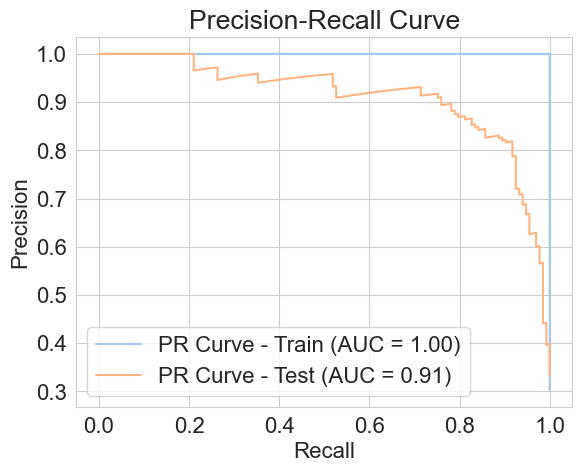

In [135]:
# Precision-Recall Curve
pr_auc_train = average_precision_score(y_train, y_pr_train_proba)
pr_auc_test = average_precision_score(y_test, y_pr_test_proba)

precision_train, recall_train, _ = precision_recall_curve(y_train, y_pr_train_proba)
precision_test, recall_test, _ = precision_recall_curve(y_test, y_pr_test_proba)

plt.plot(recall_train, precision_train, label=f'PR Curve - Train (AUC = {pr_auc_train:.2f})')
plt.plot(recall_test, precision_test, label=f'PR Curve - Test (AUC = {pr_auc_test:.2f})')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()


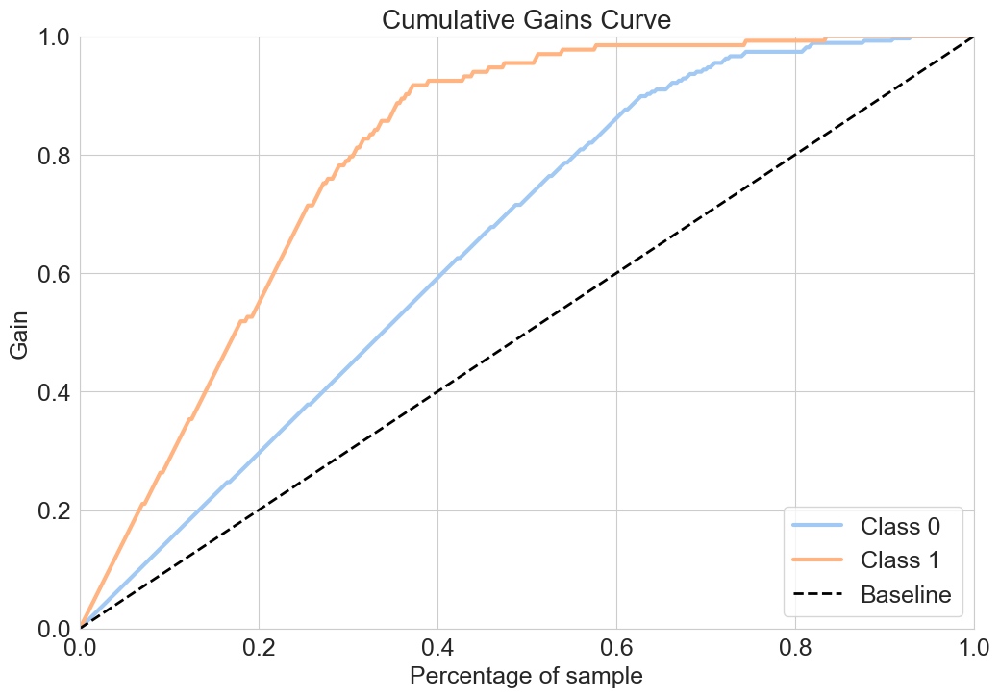

In [136]:
# Plot the Cumulative Gains Curve
skplt.metrics.plot_cumulative_gain(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

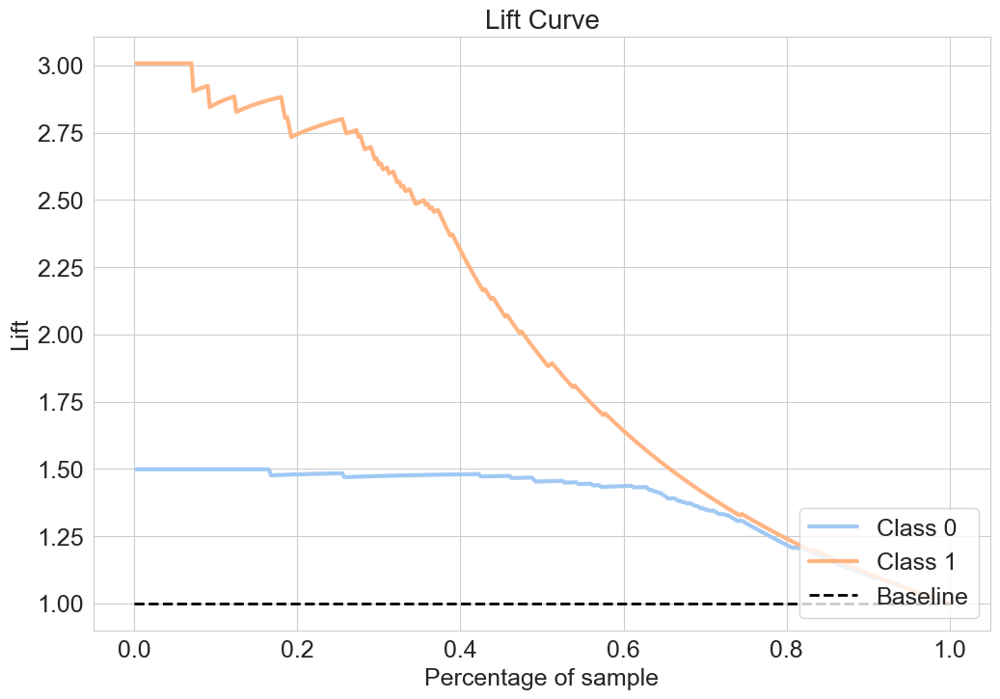

In [137]:
# Plot the Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

## Voting

In [138]:
data_path = Path.cwd().parent / "data"
X_train = pd.read_csv(data_path / "X_train.csv")
y_train = pd.read_csv(data_path / "y_train.csv")
X_test = pd.read_csv(data_path / "X_test.csv")
y_test = pd.read_csv(data_path / "y_test.csv")

In [139]:
from sklearn.ensemble import VotingClassifier

base_models = [
    ('random_forest', RandomForestClassifier(random_state=42, **best_params_rf)),
    ('xgboost', XGBClassifier(random_state=42, **best_params)),
    ('catboost', CatBoostClassifier(random_state=42, verbose=0, **best_params_catboost)),
    ('extra_trees', ExtraTreesClassifier(random_state=42, **extra_trees_best_params)),
]

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

sfm = SelectFromModel(rf_classifier, threshold=0.01)
sfm.fit(X_train, y_train)
X_train_selected = sfm.transform(X_train)
X_test_selected = sfm.transform(X_test)

for name, model in base_models:
    if name == 'random_forest':
        model.fit(X_train, y_train)
    else:
        sfm = SelectFromModel(model, threshold='median')
        sfm.fit(X_train, y_train)
        X_train_selected_model = sfm.transform(X_train)
        X_test_selected_model = sfm.transform(X_test)
        model.fit(X_train_selected_model, y_train)

# Voting Classifier
voting_classifier = VotingClassifier(estimators=base_models, voting='soft')

# Hyperparameter tuning using RandomizedSearchCV for the VotingClassifier
param_dist = {
    'weights': [None, 'uniform', 'distance'],
    'voting': ['hard', 'soft'],
    'flatten_transform': [True, False],
}

n_iter_search = 5

random_search = RandomizedSearchCV(
    voting_classifier, param_distributions=param_dist, n_iter=n_iter_search,
    cv=StratifiedKFold(n_splits=5), scoring='average_precision', random_state=42
)
random_search.fit(X_train_selected, y_train)

best_params_voting = random_search.best_params_
voting_classifier.set_params(**best_params_voting)

voting_classifier.fit(X_train_selected, y_train)


VotingClassifier(estimators=[('random_forest',
                              RandomForestClassifier(max_depth=8,
                                                     min_samples_leaf=4,
                                                     min_samples_split=7,
                                                     random_state=42)),
                             ('xgboost',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=0.4,
                                            colsample_bynode=None,
                                            colsample_bytree=0.4, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=No...
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=300, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=42, ...)),
                             ('catboost',
                              <catboost.core.CatBoostClassifier object at 0x000001E5290F2F50>),
                             ('extra_trees',
                              ExtraTreesClassifier(max_depth=8,
                                                   min_samples_leaf=2,
                                                   min_samples_split=8,
                                                   n_estimators=200,
                                                   random_state=42))],
                 flatten_transform=False, voting='soft')

In [140]:
print(best_params_voting)

{'weights': None, 'voting': 'soft', 'flatten_transform': False}


In [141]:
X_train_final_voting = X_train_selected.copy()
X_test_final_voting = X_test_selected.copy()

In [142]:
# Evaluate the model
y_pr_train_proba = voting_classifier.predict_proba(X_train_final_voting)[:, 1]  
y_pr_train_binary = voting_classifier.predict(X_train_final_voting)

acc_train = accuracy_score(y_train, y_pr_train_binary)
acc_balanced_train = balanced_accuracy_score(y_train, y_pr_train_binary)
class_re = classification_report(y_train, y_pr_train_binary)
con_mat = confusion_matrix(y_train, y_pr_train_binary)
auc_train = roc_auc_score(y_train, y_pr_train_proba)

print("Confusion Matrix:\n", con_mat)
print("\n")
print("Accuracy of the model:", acc_train * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_train * 100)
print("\n")
print("Classification report:\n", class_re)
print("AUC of the model:", auc_train)

Confusion Matrix:
 [[1115    0]
 [   7  478]]


Accuracy of the model: 99.5625


Balanced accuracy of the model: 99.27835051546393


Classification report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00      1115
           1       1.00      0.99      0.99       485

    accuracy                           1.00      1600
   macro avg       1.00      0.99      0.99      1600
weighted avg       1.00      1.00      1.00      1600

AUC of the model: 1.0


In [143]:
# Test the model
y_pr_test_proba = voting_classifier.predict_proba(X_test_final_voting)[:, 1]
y_pr_test_binary = voting_classifier.predict(X_test_final_voting)

acc_test = accuracy_score(y_test, y_pr_test_binary)
acc_balanced_test = balanced_accuracy_score(y_test, y_pr_test_binary)
class_re1 = classification_report(y_test, y_pr_test_binary)
con_mat1 = confusion_matrix(y_test, y_pr_test_binary)
auc_test = roc_auc_score(y_test, y_pr_test_proba)

print("Confusion Matrix:\n", con_mat1)
print("\n")
print("Accuracy of the model:", acc_test * 100)
print("\n")
print("Balanced accuracy of the model:", acc_balanced_test * 100)
print("\n")
print("Classification report:\n", class_re1)
print("AUC of the model:", auc_test)

Confusion Matrix:
 [[244  23]
 [ 53  80]]


Accuracy of the model: 81.0


Balanced accuracy of the model: 75.7680718650559


Classification report:
               precision    recall  f1-score   support

           0       0.82      0.91      0.87       267
           1       0.78      0.60      0.68       133

    accuracy                           0.81       400
   macro avg       0.80      0.76      0.77       400
weighted avg       0.81      0.81      0.80       400

AUC of the model: 0.8699557883472726


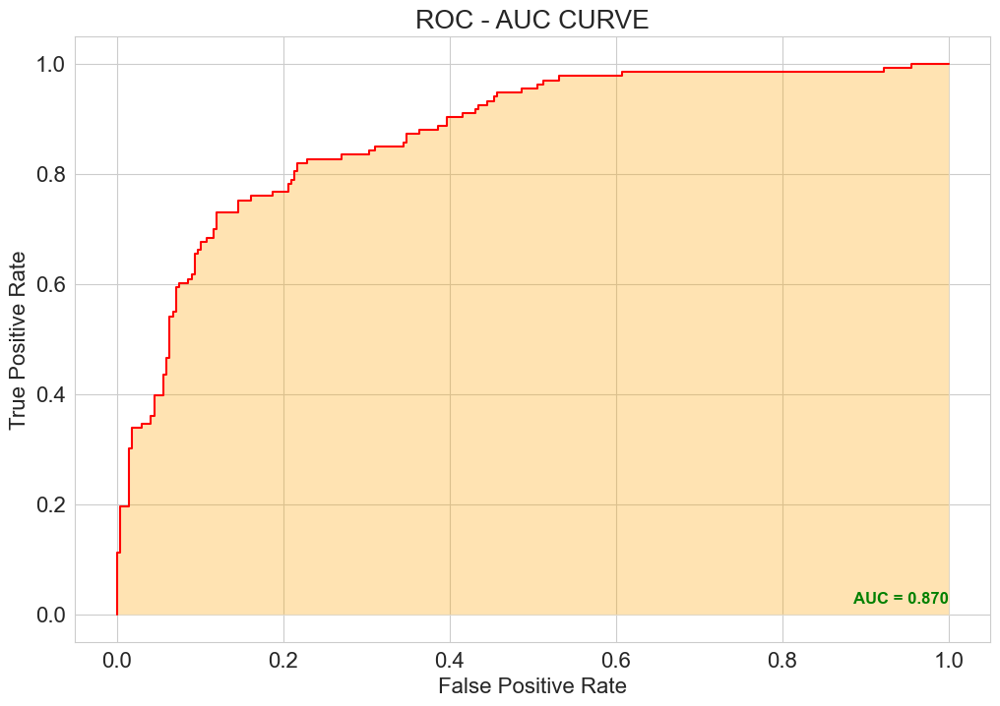

In [144]:
# Ploting the Roc - Auc Curve on Testing data
y_prob = voting_classifier.predict_proba(X_test_final_voting)
y_pr   = y_prob[:,1]
auc_score = roc_auc_score(y_test, y_pr)
fpr,tpr,threshold = roc_curve(y_test,y_pr)
plt.figure(figsize=(12, 8))
plt.plot(fpr,tpr, "r")
plt.text(1, 0.02, 'AUC = %0.3f' % auc_score, ha='right', fontsize=12,weight='bold', color='green')
plt.fill_between(fpr, tpr, facecolor='orange', alpha=0.3)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC - AUC CURVE")
plt.show()

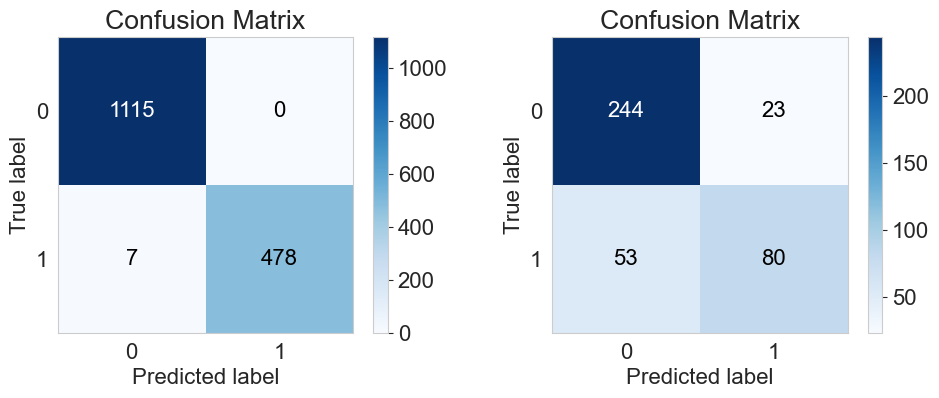

In [145]:
# Plot Confusion Matrix
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axes[0].set_title('Confusion Matrix - Train')
skplt.metrics.plot_confusion_matrix(y_train, y_pr_train_binary, ax=axes[0])
axes[1].set_title('Confusion Matrix - Test')
skplt.metrics.plot_confusion_matrix(y_test, y_pr_test_binary, ax=axes[1])

plt.tight_layout()
plt.show()

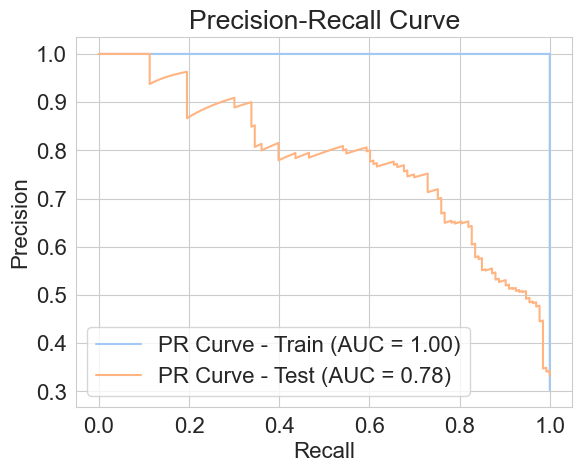

In [146]:
# Precision-Recall Curve

pr_auc_train = average_precision_score(y_train, y_pr_train_proba)
pr_auc_test = average_precision_score(y_test, y_pr_test_proba)

precision_train, recall_train, _ = precision_recall_curve(y_train, y_pr_train_proba)
precision_test, recall_test, _ = precision_recall_curve(y_test, y_pr_test_proba)

plt.plot(recall_train, precision_train, label=f'PR Curve - Train (AUC = {pr_auc_train:.2f})')
plt.plot(recall_test, precision_test, label=f'PR Curve - Test (AUC = {pr_auc_test:.2f})')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()


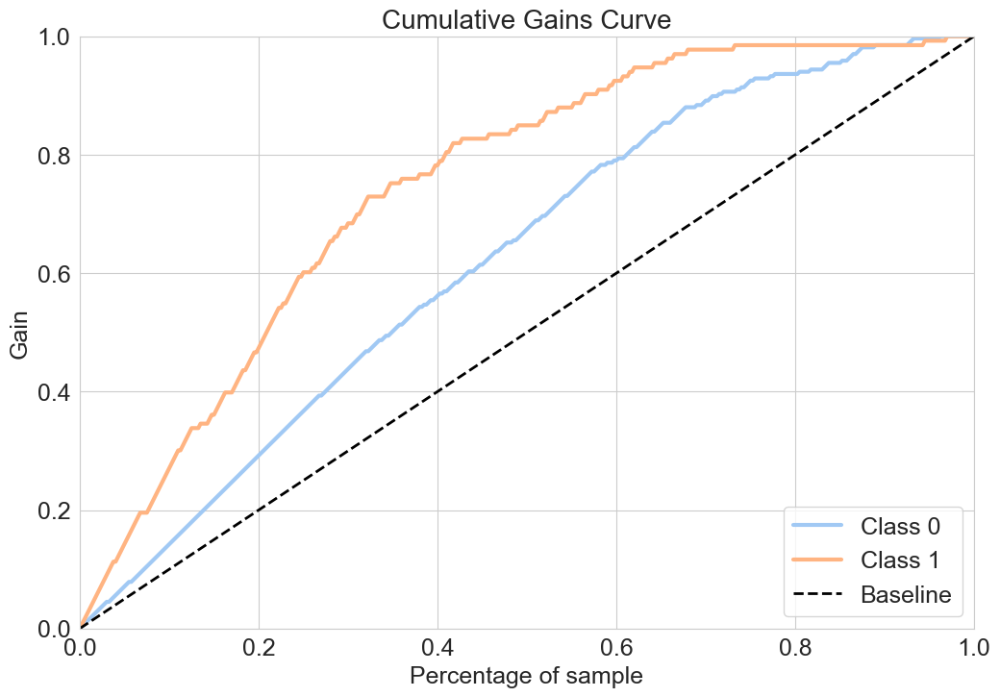

In [147]:
# Plot the Cumulative Gains Curve
skplt.metrics.plot_cumulative_gain(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

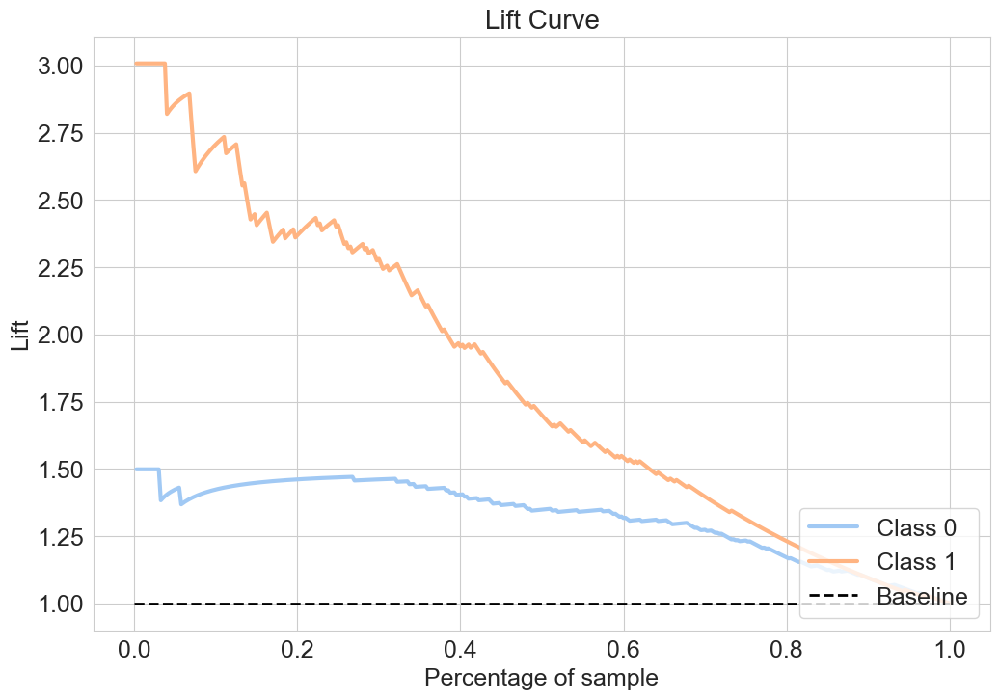

In [148]:
# Plot Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, figsize=(12, 8), title_fontsize=20, text_fontsize=18)
plt.show()

# Comparison

## Evaluation of Models

The provided Receiver Operating Characteristic (ROC) curve offers a comparative assessment of the performance of various machine learning classifiers, including Random Forest, XGBoost, CatBoost, Extra Trees, Stacking Classifier, and Voting Classifier. The ROC curve plots the True Positive Rate against the False Positive Rate for different thresholds, providing insights into the models' ability to discriminate between classes.

The Stacking Classifier emerges as the top performer with the highest Area Under the Curve (AUC) value of 0.95, followed closely by XGBoost and Extra Trees, both exhibiting robust AUC values of 0.92. CatBoost also demonstrates strong performance with an AUC of 0.90. Random Forest and Voting Classifier perform reasonably well, with AUC values of 0.86 and 0.87, respectively, indicating their effectiveness in classification tasks.

This visual assessment underscores the superiority of ensemble methods in enhancing predictive accuracy. However, it's crucial to consider factors such as model complexity, interpretability, and resource efficiency before finalizing a choice. Validating these results on an independent test set is essential to ensure the models' generalizability and avoid overfitting to the training data.

The Precision-Recall curve provides additional insights into model performance, particularly in scenarios with imbalanced classes. The Stacking Classifier stands out with an impressive Area Under the Precision-Recall Curve (AUC-PR) of 0.91, indicating high precision without sacrificing recall. XGBoost and Extra Trees also perform well, achieving AUC-PR values of 0.85.

Models exhibit varying trade-offs between precision and recall, highlighting the challenge of balancing these metrics. The Random Forest, with the lowest AUC-PR score of 0.76, indicates a comparatively lesser ability to balance precision and recall.

In practical terms, models positioned towards the top-right corner of the curve are typically more desirable, achieving high recall while maintaining high precision. The Stacking Classifier, in particular, demonstrates a robust predictive ability critical in applications where false positives incur significant costs, such as in credit risk tasks.

The Precision-Recall curve encapsulates not just quantitative metrics but also provides qualitative insights into model robustness, essential for tasks where both precision and recall are critical. It underscores the nuanced nature of model selection, where a careful balance of various factors is necessary for optimal performance.


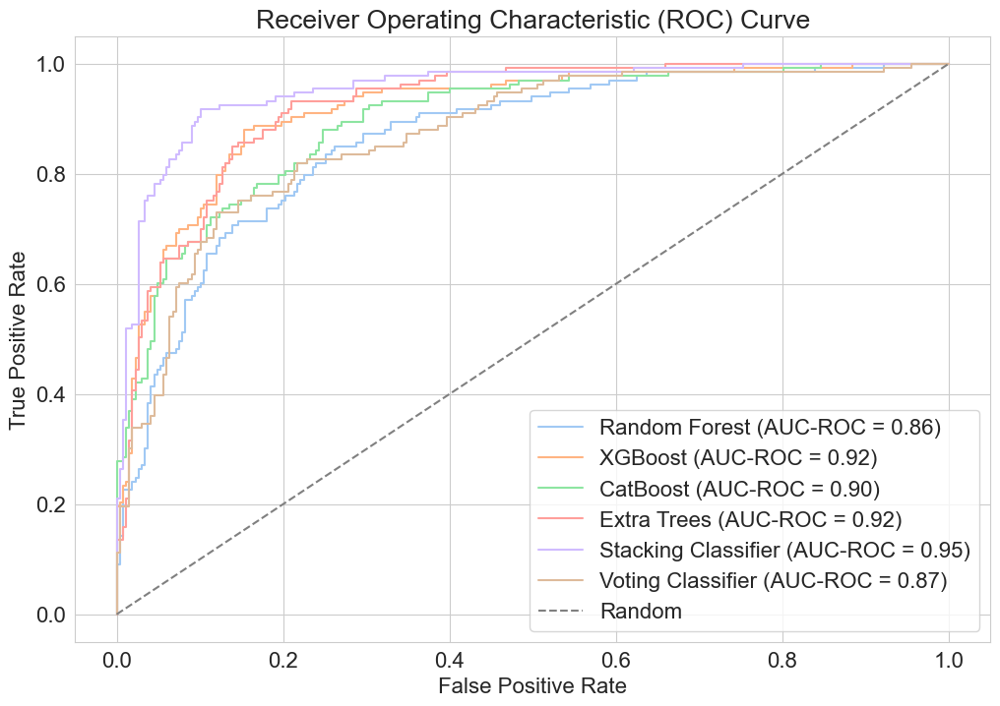

In [149]:
# Plot the ROC curve for all models
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.metrics import balanced_accuracy_score

models = {
    'Random Forest': rf_model,
    'XGBoost': xgb_model,
    'CatBoost': cat_model,
    'Extra Trees': extra_trees_model,
    'Stacking Classifier': stacking_classifier,
    'Voting Classifier': voting_classifier,
}

datasets = {
    'Random Forest': X_test_final_rf,
    'XGBoost': X_test_final_xgb,
    'CatBoost': X_test_final_cat,
    'Extra Trees': X_test_final_extra_trees,
    'Stacking Classifier': X_test_final_stacking,
    'Voting Classifier': X_test_final_voting,
}

plt.figure(figsize=(12, 8))
for model_name, model in models.items():
    X_test_selected = datasets[model_name]
    y_proba = model.predict_proba(X_test_selected)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{model_name} (AUC-ROC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='grey', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()

plt.show()


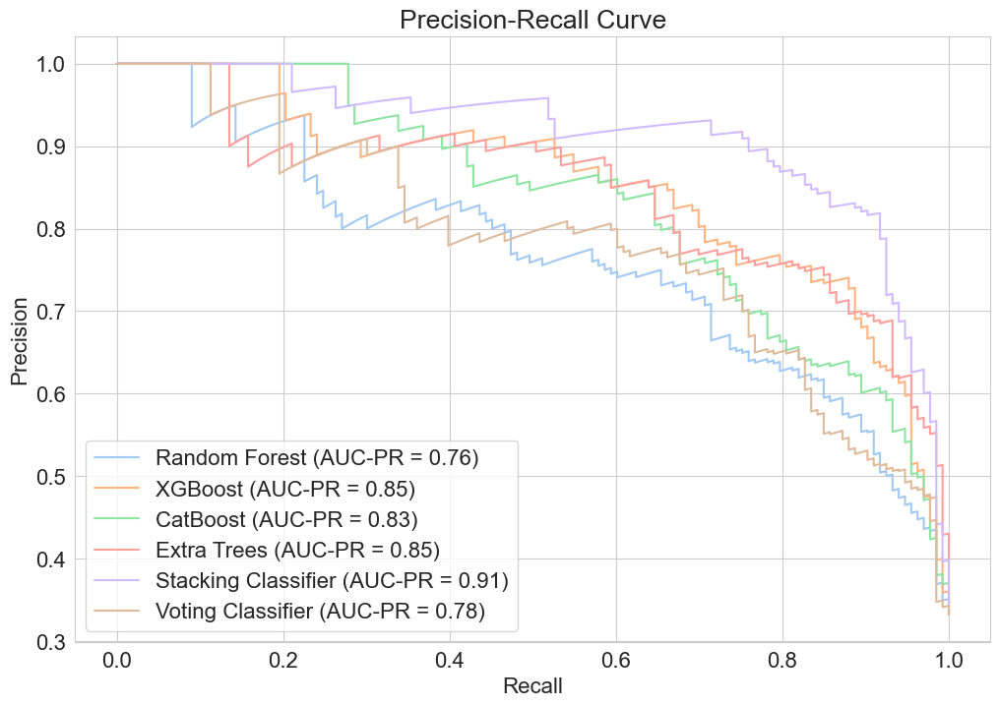

In [150]:
# Plot the Precision-Recall curve for all models
plt.figure(figsize=(12, 8))
for model_name, model in models.items():
    X_test_selected = datasets[model_name]
    y_proba = model.predict_proba(X_test_selected)[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, y_proba)
    pr_auc = average_precision_score(y_test, y_proba)
    plt.plot(recall, precision, label=f'{model_name} (AUC-PR = {pr_auc:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.show()

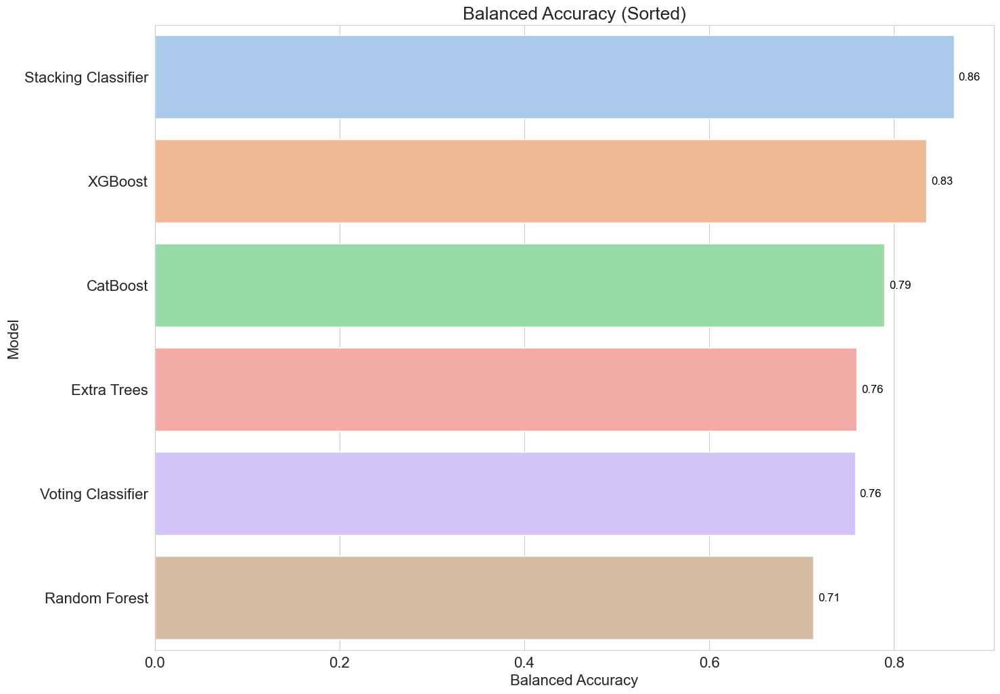

In [151]:
# Balanced Accuracy
plt.figure(figsize=(16, 12))
balanced_accuracy_dict = {}
for model_name, model in models.items():
    X_test_selected = datasets[model_name]
    y_pred = model.predict(X_test_selected)
    balanced_acc = balanced_accuracy_score(y_test, y_pred)
    balanced_accuracy_dict[model_name] = balanced_acc

sorted_balanced_accuracy_dict = dict(sorted(balanced_accuracy_dict.items(), key=lambda item: item[1], reverse=True))

barplot = sns.barplot(x=list(sorted_balanced_accuracy_dict.values()), y=list(sorted_balanced_accuracy_dict.keys()))

for p, label in zip(barplot.patches, sorted_balanced_accuracy_dict.values()):
    barplot.annotate(f'{label:.2f}', (p.get_width(), p.get_y() + p.get_height() / 2.),
                     ha='left', va='center', fontsize=12, color='black', xytext=(5, 0),
                     textcoords='offset points')

plt.title('Balanced Accuracy (Sorted)')
plt.xlabel('Balanced Accuracy')
plt.ylabel('Model')
plt.show()


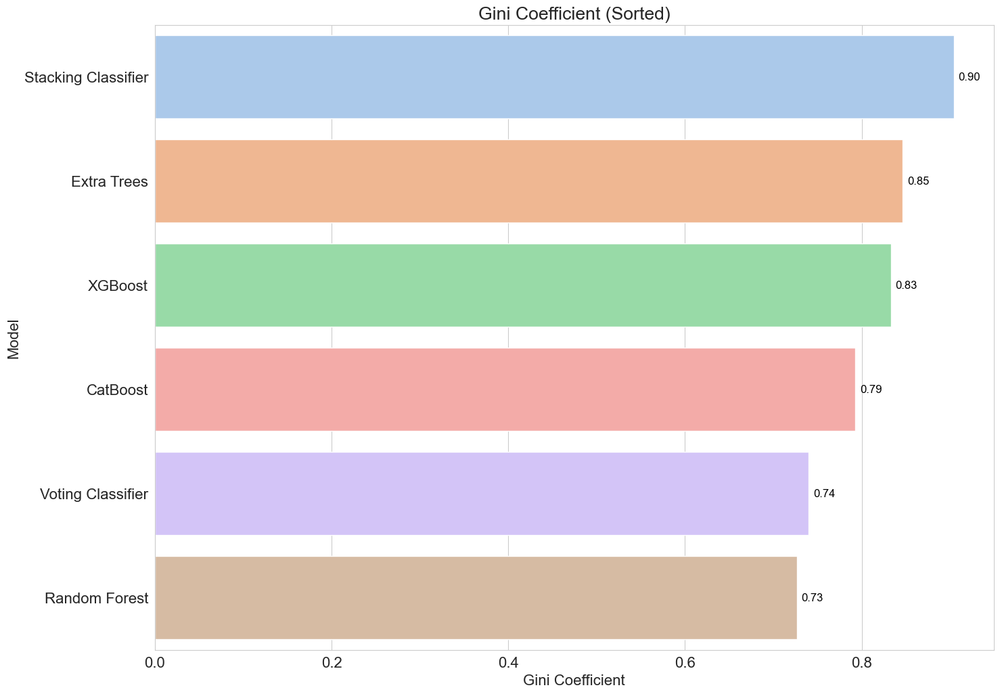

In [152]:
# Gini Coefficient
plt.figure(figsize=(16, 12))
gini_dict = {}
for model_name, model in models.items():
    X_test_selected = datasets[model_name]
    y_pred_prob = model.predict_proba(X_test_selected)[:, 1]  # Assuming binary classification
    gini = 2 * roc_auc_score(y_test, y_pred_prob) - 1
    gini_dict[model_name] = gini

sorted_gini_dict = dict(sorted(gini_dict.items(), key=lambda item: item[1], reverse=True))

barplot_gini = sns.barplot(x=list(sorted_gini_dict.values()), y=list(sorted_gini_dict.keys()), orient='h')

for p, label in zip(barplot_gini.patches, sorted_gini_dict.values()):
    barplot_gini.annotate(f'{label:.2f}', (p.get_width(), p.get_y() + p.get_height() / 2.),
                          ha='left', va='center', fontsize=12, color='black', xytext=(5, 0),
                          textcoords='offset points')

plt.title('Gini Coefficient (Sorted)')
plt.xlabel('Gini Coefficient')
plt.ylabel('Model')
plt.show()


### Summary and Reflection

In this comprehensive analysis, we delved into the intricacies of a classification task aimed at predicting creditworthiness. Leveraging a diverse set of advanced machine learning techniques and models, including Random Forest, XGBoost, CatBoost, and Extra Trees, we embarked on a journey to construct a robust predictive model.

#### Model Development and Evaluation

Our approach began with rigorous preprocessing, encompassing data cleaning and encoding categorical variables. Feature engineering techniques were employed to extract meaningful insights from the dataset, while feature selection using forward selection with Random Forest further refined the feature set.

Hyperparameter tuning through Random Search optimization fine-tuned model parameters, ensuring optimal performance. We evaluated model performance using a suite of metrics including AUC PR, balanced accuracy, and Gini coefficient, providing a comprehensive assessment of predictive capability across different models.

#### Ensemble Methods for Enhanced Predictive Power

Ensemble methods, such as stacking and voting classifiers, emerged as powerful tools for aggregating predictions from multiple base models. By integrating insights from diverse models like RF, XGB, CatBoost, and Extra Trees, these ensemble methods showcased superior predictive accuracy and resilience.

The stacking classifier achieved remarkable performance on test data, with a balanced accuracy of 86.47% and an AUC of 0.952, underscoring its efficacy in harnessing the collective wisdom of base models. Meanwhile, the voting classifier, while slightly less accurate, still demonstrated competitive performance with a balanced accuracy of 75.77% and an AUC of 0.87.

#### Future Directions and Improvement

Looking ahead, there are several avenues for further refinement and enhancement of the predictive model:
- Explore the integration of Synthetic Minority Over-sampling Technique (SMOTE) to address class imbalance
- Mitigate overfitting with more sophisticated regularization techniques
- Explore other hyperparameter optimization techniques such as Grid Search or Bayesian Optimization

In conclusion, this classification task exemplifies the power of advanced machine learning techniques in addressing complex real-world challenges. By leveraging ensemble methods, rigorous evaluation, and continuous improvement, we can develop predictive models with high accuracy and reliability, paving the way for informed decision-making and positive outcomes in credit assessment scenarios.